load packages


In [ ]:
import time
import tensorflow as tf
import numpy as np
from glob import glob
import datetime
import random
import PIL
from PIL import Image
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook as tqdm
%matplotlib inline
import urllib
import tarfile
import xml.etree.ElementTree as ET
from imageio import imread, imsave, mimsave
import shutil
import cv2
import glob
from imageio import imread, imsave, mimsave
import os

In [ ]:
all_images=os.listdir("generative-yoga-images/all-poses/all-poses")
print(f"Total images : {len(all_images)}")

Total images : 1038


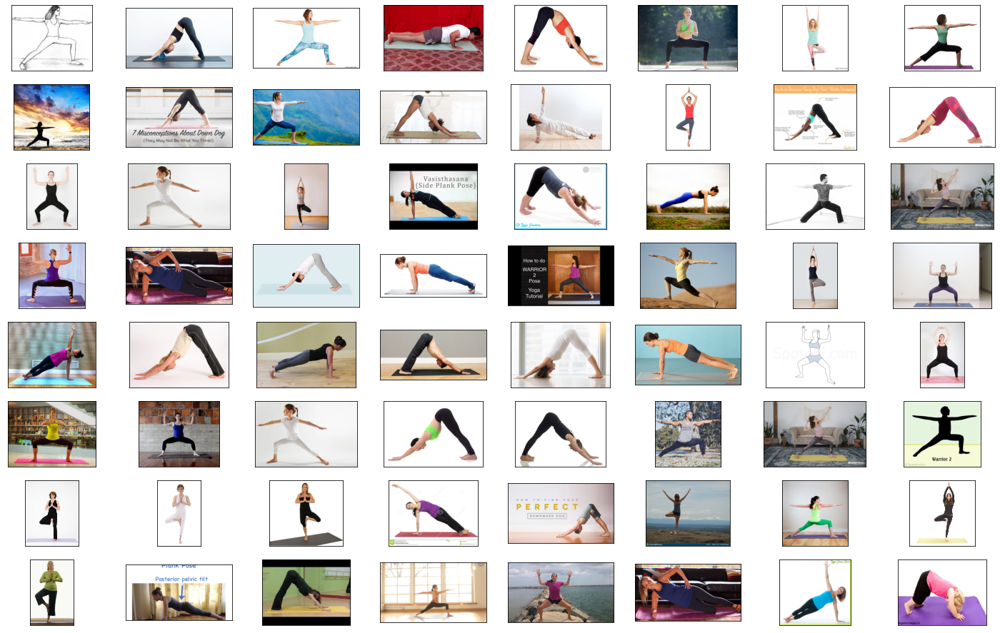

In [ ]:
img_base_path = "generative-yoga-images/all-poses/all-poses"
images=os.listdir("generative-yoga-images/all-poses/all-poses")
# choose 16 random images to display
images_to_display = random.choices(images, k=64)

fig = plt.figure(figsize=(25, 16))
for ii, img in enumerate(images_to_display):
    ax = fig.add_subplot(8, 8, ii + 1, xticks=[], yticks=[])
    
    img = Image.open(os.path.join(img_base_path, img))
    plt.imshow(img)

In [ ]:
images_to_display[18]

'warrior2 (115).jpg'

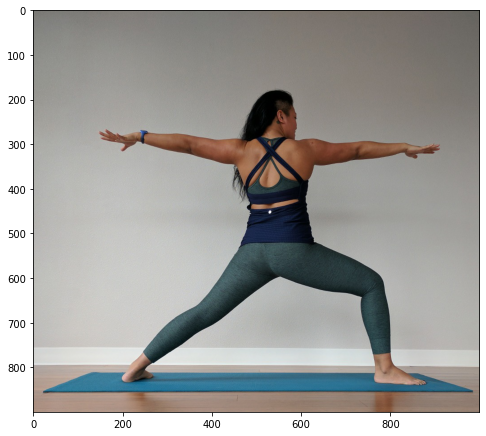

In [ ]:
image_name = 'warrior2 (10).jpg'

# read image
img = Image.open(os.path.join(img_base_path, image_name))

# display image
fig = plt.figure(figsize=(8, 12))
plt.imshow(img)

In [ ]:
image_name[:-4]

'warrior2 (10)'

In [ ]:
# finding annotation of this particular image
# image_name == dogBreed_number

annotation_folders = os.listdir('generative-yoga-images/annotations')
breed_folder = [x for x in annotation_folders if image_name.split(' ')[0] in x]
assert len(breed_folder) == 1, "Multiple Folders Found"

breed_folder = breed_folder[0]
print("Image Folder: ", breed_folder)
annotation_path = os.path.join('generative-yoga-images/annotations', breed_folder, image_name[:-4] +'.xml')
print("Annotation Path: ", annotation_path)


Image Folder:  warrior2
Annotation Path:  generative-yoga-images/annotations/warrior2/warrior2 (10).xml


In [ ]:
!cat '/content/generative-yoga-images/annotations/warrior2/warrior2 (10).xml'

<annotation>
	<folder>warrior2</folder>
	<filename>warrior2 (10).jpg</filename>
	<path>/warrior2/warrior2 (10).jpg</path>
	<source>
		<database>Unspecified</database>
	</source>
	<size>
		<width>1000</width>
		<height>900</height>
		<depth>3</depth>
	</size>
	<object>
		<name>warrior2</name>
		<pose>Unspecified</pose>
		<truncated>Unspecified</truncated>
		<difficult>Unspecified</difficult>
		<bndbox>
			<xmin>134</xmin>
			<ymin>162</ymin>
			<xmax>911</xmax>
			<ymax>861</ymax>
		</bndbox>
	</object>
</annotation>

Bounding Box:  (134, 162, 911, 861)


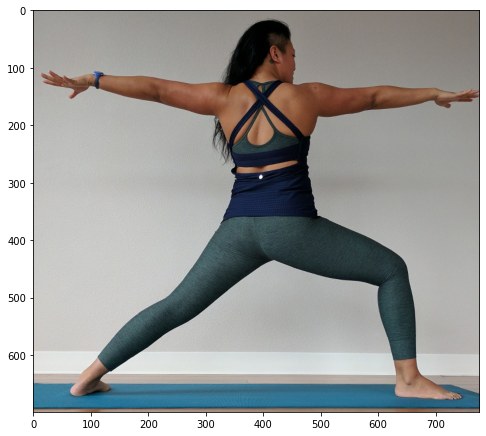

In [ ]:
### Getting Bounding Box of dog (ROI) in Image
tree = ET.parse(annotation_path)
root = tree.getroot()
objects = root.findall('object')
for obj in objects:
    bndbox = obj.find('bndbox')
    xmin = int(bndbox.find('xmin').text)
    ymin = int(bndbox.find('ymin').text)
    xmax = int(bndbox.find('xmax').text)
    ymax = int(bndbox.find('ymax').text)
bbox = (xmin, ymin, xmax, ymax)
print("Bounding Box: ", bbox)

# crop image
img = img.crop(bbox)

# display crop image
fig = plt.figure(figsize=(8, 12))
plt.imshow(img)

In [ ]:
#!ls all-poses/all-poses

In [ ]:
root_images = "generative-yoga-images/all-poses/all-poses/"
root_annots = "generative-yoga-images/annotations/"
INPUT_DATA_DIR = "generative-yoga-images/all-poses/all-poses/"
IMG_DIR = "generated-images"
ComputeLB = False 
PosesOnly = True

0
50
100
150
200
250
300
350
400
450
500
550
600
650
700
750
800
850
900
950
1000


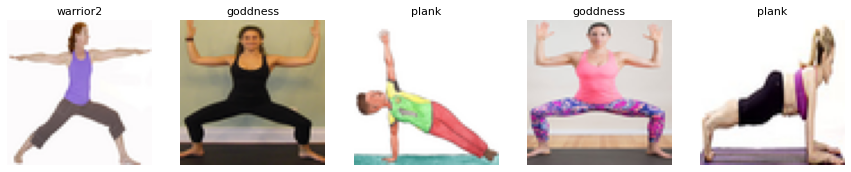

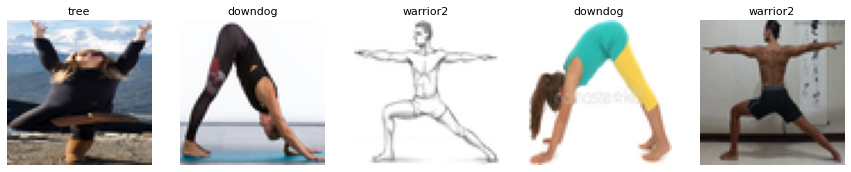

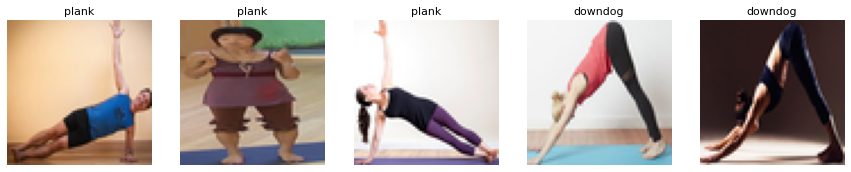

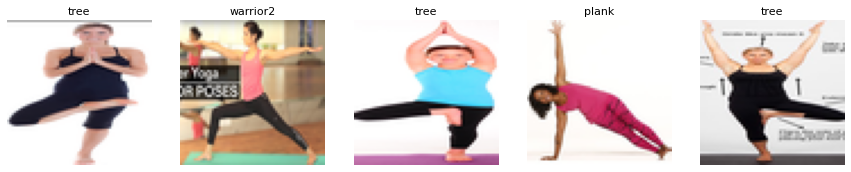

In [ ]:
import numpy as np, pandas as pd, os
import xml.etree.ElementTree as ET 
import matplotlib.pyplot as plt, zipfile 
from PIL import Image, ImageFile
from glob import glob
ImageFile.LOAD_TRUNCATED_IMAGES = True

ROOT = 'generative-yoga-images/'
IMAGES = os.listdir(ROOT + 'all-poses/all-poses/')
#poses = os.listdir(ROOT + 'annotations/') 
poses=['tree', 'plank', 'goddness', 'downdog', 'warrior2'] 

idxIn = 0; namesIn = []
imagesIn = np.zeros((1038,64,64,3))

# CROP WITH BOUNDING BOXES TO GET DOGS ONLY
#https://www.kaggle.com/paulorzp/show-annotations-and-breeds
if PosesOnly:
    for pose in poses:
        for dog in os.listdir(ROOT+'annotations/'+pose):
            try: img = Image.open(ROOT+'all-poses/all-poses/'+dog[:-4]+'.jpg').convert('RGB') 
            except: continue           
            tree = ET.parse(ROOT+'annotations/'+pose+'/'+dog)
            root = tree.getroot()
            objects = root.findall('object')
            for o in objects:
                bndbox = o.find('bndbox') 
                xmin = int(bndbox.find('xmin').text)
                ymin = int(bndbox.find('ymin').text)
                xmax = int(bndbox.find('xmax').text)
                ymax = int(bndbox.find('ymax').text)
                bbox = (xmin, ymin, xmax, ymax)
                img2 = img.crop(bbox)
                img2 = img2.resize((64,64), Image.ANTIALIAS)
                imagesIn[idxIn,:,:,:] = np.asarray(img2)
                if idxIn%50==0: print(idxIn)
                namesIn.append(pose)
                idxIn += 1
    idx = np.arange(idxIn)
    np.random.shuffle(idx)
    imagesIn = imagesIn[idx,:,:,:]
    namesIn = np.array(namesIn)[idx]


#     # RANDOMLY CROP FULL IMAGES
# else:
#     x = np.random.choice(np.arange(20579),10000)
#     for k in range(len(x)):
#         img = Image.open(ROOT + 'all-poses/all-poses/' + IMAGES[x[k]])
#         w = img.size[0]
#         h = img.size[1]
#         sz = np.min((w,h))
#         a=0; b=0
#         if w<h: b = (h-sz)//2
#         else: a = (w-sz)//2
#         img = img.crop((0+a, 0+b, sz+a, sz+b))  
#         img = img.resize((64,64), Image.ANTIALIAS)   
#         imagesIn[idxIn,:,:,:] = np.asarray(img)
#         namesIn.append(IMAGES[x[k]])
#         if idxIn%1000==0: print(idxIn)
#         idxIn += 1
    

#fig = plt.figure(figsize=(8, 12))
#plt.imshow(img)

# DISPLAY CROPPED IMAGES
x = np.random.randint(0,idxIn,20)
for k in range(4):
    plt.figure(figsize=(15,3))
    for j in range(5):
        plt.subplot(1,5,j+1)
        img = Image.fromarray( imagesIn[x[k*5+j],:,:,:].astype('uint8') )
        plt.axis('off')
        if not PosesOnly: plt.title(namesIn[x[k*5+j]],fontsize=11)
        else: plt.title(namesIn[x[k*5+j]],fontsize=11)
        plt.imshow(img)
    plt.show()

### **Generator**

In [ ]:
def generator(z, output_channel_dim, training):
    with tf.variable_scope("generator", reuse= not training):
        
        # 4x4x512
        fully_connected = tf.layers.dense(z, 4*4*512)
        fully_connected = tf.reshape(fully_connected, (-1, 4, 4, 512))
        fully_connected = tf.nn.leaky_relu(fully_connected)

        # 4x4x512 -> 8x8x256
        trans_conv1 = tf.layers.conv2d_transpose(inputs=fully_connected,
                                                 filters=256,
                                                 kernel_size=[5,5],
                                                 strides=[2,2],
                                                 padding="SAME",
                                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                                 name="trans_conv1")
        batch_trans_conv1 = tf.layers.batch_normalization(inputs = trans_conv1,
                                                          training=training,
                                                          epsilon=EPSILON,
                                                          name="batch_trans_conv1")
        trans_conv1_out = tf.nn.leaky_relu(batch_trans_conv1,
                                           name="trans_conv1_out")
        
        # 8x8x256 -> 16x16x128
        trans_conv2 = tf.layers.conv2d_transpose(inputs=trans_conv1_out,
                                                 filters=128,
                                                 kernel_size=[5,5],
                                                 strides=[2,2],
                                                 padding="SAME",
                                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                                 name="trans_conv2")
        batch_trans_conv2 = tf.layers.batch_normalization(inputs = trans_conv2,
                                                          training=training,
                                                          epsilon=EPSILON,
                                                          name="batch_trans_conv2")
        trans_conv2_out = tf.nn.leaky_relu(batch_trans_conv2,
                                           name="trans_conv2_out")
        
                # 16x16x128 -> 32x32x64
        trans_conv3 = tf.layers.conv2d_transpose(inputs=trans_conv2_out,
                                                 filters=64,
                                                 kernel_size=[5,5],
                                                 strides=[2,2],
                                                 padding="SAME",
                                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                                 name="trans_conv3")
        batch_trans_conv3 = tf.layers.batch_normalization(inputs = trans_conv3,
                                                          training=training,
                                                          epsilon=EPSILON,
                                                          name="batch_trans_conv3")
        trans_conv3_out = tf.nn.leaky_relu(batch_trans_conv3,
                                           name="trans_conv3_out")
        

        # 32x32x64 -> 64x64x32
        trans_conv4 = tf.layers.conv2d_transpose(inputs=trans_conv3_out,
                                                 filters=32,
                                                 kernel_size=[5,5],
                                                 strides=[2,2],
                                                 padding="SAME",
                                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                                 name="trans_conv4")
        batch_trans_conv4 = tf.layers.batch_normalization(inputs = trans_conv4,
                                                          training=training,
                                                          epsilon=EPSILON,
                                                          name="batch_trans_conv4")
        trans_conv4_out = tf.nn.leaky_relu(batch_trans_conv4,
                                           name="trans_conv4_out")
        
        # 64x64x32 -> 64x64x3
        logits = tf.layers.conv2d_transpose(inputs=trans_conv4_out,
                                            filters=3,
                                            kernel_size=[5,5],
                                            strides=[1,1],
                                            padding="SAME",
                                            kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                            name="logits")
        out = tf.tanh(logits, name="out")
        return out


### **Discriminator**

In [ ]:
def discriminator(x, reuse):
    with tf.variable_scope("discriminator", reuse=reuse): 
        
        # 64x64x3 -> 32x32x32
        conv1 = tf.layers.conv2d(inputs=x,
                                 filters=32,
                                 kernel_size=[5,5],
                                 strides=[2,2],
                                 padding="SAME",
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='conv1')
        batch_norm1 = tf.layers.batch_normalization(conv1,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm1')
        conv1_out = tf.nn.leaky_relu(batch_norm1,
                                     name="conv1_out")
        
        # 32x32x32 -> 16x16x64
        conv2 = tf.layers.conv2d(inputs=conv1_out,
                                 filters=64,
                                 kernel_size=[5, 5],
                                 strides=[2, 2],
                                 padding="SAME",
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='conv2')
        batch_norm2 = tf.layers.batch_normalization(conv2,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm2')
        conv2_out = tf.nn.leaky_relu(batch_norm2,
                                     name="conv2_out")
        
        # 16x16x64 -> 8x8x128
        conv3 = tf.layers.conv2d(inputs=conv2_out,
                                 filters=128,
                                 kernel_size=[5, 5],
                                 strides=[2, 2],
                                 padding="SAME",
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='conv3')
        batch_norm3 = tf.layers.batch_normalization(conv3,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm3')
        conv3_out = tf.nn.leaky_relu(batch_norm3,
                                     name="conv3_out")
        
         # 8x8x128 -> 8x8x256
        conv4 = tf.layers.conv2d(inputs=conv3_out,
                                 filters=256,
                                 kernel_size=[5, 5],
                                 strides=[1, 1],
                                 padding="SAME",
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='conv4')
        batch_norm4 = tf.layers.batch_normalization(conv4,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm4')
        conv4_out = tf.nn.leaky_relu(batch_norm4,
                                     name="conv4_out")
        
        # 8x8x256 -> 4x4x512
        
        conv5 = tf.layers.conv2d(inputs=conv4_out,
                                filters=512,
                                kernel_size=[5, 5],
                                strides=[2, 2],
                                padding="SAME",
                                kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                name='conv5')
        batch_norm5 = tf.layers.batch_normalization(conv5,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm5')
        conv5_out = tf.nn.leaky_relu(batch_norm5,
                                     name="conv5_out")

        flatten = tf.reshape(conv5_out, (-1, 4*4*512))
        logits = tf.layers.dense(inputs=flatten,
                                 units=1,
                                 activation=None)
        out = tf.sigmoid(logits)
        return out, logits

# **Loss and Optimizer**

In [ ]:
def model_loss(input_real, input_z, output_channel_dim):
    g_model = generator(input_z, output_channel_dim, True)

    noisy_input_real = input_real + tf.random_normal(shape=tf.shape(input_real),
                                                     mean=0.0,
                                                     stddev=random.uniform(0.0, 0.1),
                                                     dtype=tf.float32)
    
    d_model_real, d_logits_real = discriminator(noisy_input_real, reuse=False)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real,
                                                                         labels=tf.ones_like(d_model_real)*random.uniform(0.9, 1.0)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                                                         labels=tf.zeros_like(d_model_fake)))
    d_loss = tf.reduce_mean(0.5 * (d_loss_real + d_loss_fake))
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                                                    labels=tf.ones_like(d_model_fake)))
    return d_loss, g_loss

In [ ]:
def model_optimizers(d_loss, g_loss):
    t_vars = tf.trainable_variables()
    g_vars = [var for var in t_vars if var.name.startswith("generator")]
    d_vars = [var for var in t_vars if var.name.startswith("discriminator")]
    
    update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    gen_updates = [op for op in update_ops if op.name.startswith('generator')]
    
    with tf.control_dependencies(gen_updates):
        d_train_opt = tf.train.AdamOptimizer(learning_rate=LR_D, beta1=BETA1_D).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate=LR_G, beta1=BETA1_G).minimize(g_loss, var_list=g_vars)  
    return d_train_opt, g_train_opt

In [ ]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='inputs_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name="input_z")
    learning_rate_G = tf.placeholder(tf.float32, name="lr_g")
    learning_rate_D = tf.placeholder(tf.float32, name="lr_d")
    return inputs_real, inputs_z, learning_rate_G, learning_rate_D

### **Utils**

In [ ]:
def show_samples(sample_images, name, epoch):
    figure, axes = plt.subplots(1, len(sample_images), figsize = (IMAGE_SIZE, IMAGE_SIZE))
    for index, axis in enumerate(axes):
        axis.axis('off')
        image_array = sample_images[index].astype('uint8') 
        axis.imshow(image_array)
    plt.show()
    plt.close()


In [ ]:
def save_samples(sample_images, name, epoch):
    # save images
    for index,img in enumerate(sample_images):
        image = Image.fromarray(img.astype('uint8') )
        image.save(name+"_"+str(epoch)+"_"+str(index)+".png") 

In [ ]:
def test(sess, input_z, out_channel_dim, epoch):
    example_z = np.random.uniform(-1, 1, size=[SAMPLES_TO_SHOW, input_z.get_shape().as_list()[-1]])
    samples = sess.run(generator(input_z, out_channel_dim, False), feed_dict={input_z: example_z})
    sample_images = [((sample + 1.0) * 127.5).astype(np.uint8) for sample in samples]
    show_samples(sample_images, IMG_DIR + "samples", epoch)

In [ ]:
def generate (sess, input_z, out_channel_dim):
    print (">> Generating 1k images ...")
    for i in tqdm(range(100)):
        example_z = np.random.uniform(-1, 1, size=[100, 100]).astype(np.float32)
        imgs = sess.run(generator(input_z, out_channel_dim, False), feed_dict={input_z: example_z})
        imgs = [((img + 1.0) * 127.5).astype(np.uint8) for img in imgs]
        for j in range(len(imgs)):
            imsave(os.path.join(IMG_DIR, f'pose_{i}_{j}.png'), imgs[j])

In [ ]:
def summarize_epoch(epoch, duration, sess, d_losses, g_losses, input_z, data_shape):
    minibatch_size = int(data_shape[0]//BATCH_SIZE)
    print("Epoch {}/{}".format(epoch, EPOCHS),
          "\nDuration: {:.5f}".format(duration),
          "\nD Loss: {:.5f}".format(np.mean(d_losses[-minibatch_size:])),
          "\nG Loss: {:.5f}".format(np.mean(g_losses[-minibatch_size:])))
    
    fig, ax = plt.subplots()
    plt.plot(d_losses, label='Discriminator', alpha=0.6)
    plt.plot(g_losses, label='Generator', alpha=0.6)
    plt.title("Losses")
    plt.legend()
    #plt.savefig(OUTPUT_DIR + "losses_" + str(epoch) + ".png")
    plt.show()
    plt.close()
    test(sess, input_z, data_shape[3], epoch)

In [ ]:
  def get_batches(data):
    batches = []
    for i in range(int(data.shape[0]//BATCH_SIZE)):
        batch = data[i * BATCH_SIZE:(i + 1) * BATCH_SIZE]
        augmented_images = []
        for img in batch:
            image = Image.fromarray(img.astype('uint8'))
            if random.choice([True, False]):
                image = image.transpose(Image.FLIP_LEFT_RIGHT)
            augmented_images.append(np.asarray(image))
        batch = np.asarray(augmented_images)
        normalized_batch = (batch / 127.5) - 1.0
        batches.append(normalized_batch)
    return batches

# **Training**

In [ ]:
!mkdir images
!ls

drive  generative-yoga-images  images  sample_data


In [ ]:
def train(get_batches, data_shape, LR_G = 2e-4, LR_D = 0.0005):
    input_images, input_z, lr_G, lr_D = model_inputs(data_shape[1:], NOISE_SIZE)
    d_loss, g_loss = model_loss(input_images, input_z, data_shape[3])
    d_opt, g_opt = model_optimizers(d_loss, g_loss)
    generator_epoch_loss = 0
    train_d_losses = []
    train_g_losses = []
    generator_epoch_loss = 999
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        epoch = 0
        iteration = 0
        d_losses = []
        g_losses = []
        
        for epoch in tqdm(range(EPOCHS)):        
            epoch += 1
            start_time = time.time()
                
            for batch_images in get_batches:
                iteration += 1
                batch_z = np.random.uniform(-1, 1, size=(BATCH_SIZE, NOISE_SIZE))
                _ = sess.run(d_opt, feed_dict={input_images: batch_images, input_z: batch_z, lr_D: LR_D})
                _ = sess.run(g_opt, feed_dict={input_images: batch_images, input_z: batch_z, lr_G: LR_G})
                d_losses.append(d_loss.eval({input_z: batch_z, input_images: batch_images}))
                g_losses.append(g_loss.eval({input_z: batch_z}))

            summarize_epoch(epoch, time.time()-start_time, sess, d_losses, g_losses, input_z, data_shape)
            minibatch_size = int(data_shape[0]//BATCH_SIZE)
            generator_epoch_loss = np.mean(g_losses[-minibatch_size:])
            train_d_losses.append(np.mean(d_losses[-minibatch_size:]))
            train_g_losses.append(np.mean(g_losses[-minibatch_size:]))
            
            if epoch == EPOCHS:
                generate (sess, input_z, out_channel_dim=3)
            
    fig, ax = plt.subplots()
    plt.plot(train_d_losses, label='Discriminator', alpha=0.5)
    plt.plot(train_g_losses, label='Generator', alpha=0.5)
    plt.title("Training Losses")
    plt.legend()
    plt.savefig('train_losses.png')
    plt.show()
    plt.close()

hyperparameters

In [ ]:
IMAGE_SIZE = 64
NOISE_SIZE = 100
LR_D = 0.0005
LR_G = 2e-4
BATCH_SIZE = 64
EPOCHS = 100
BETA1_G = 0.5
BETA1_D = 0.5
WEIGHT_INIT_STDDEV = 0.02
MOMENTUM = 0.9
EPSILON = 0.0005
SAMPLES_TO_SHOW = 5 # each epoch

training loop

In [ ]:
import tensorflow as tf

In [ ]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

Instructions for updating:
non-resource variables are not supported in the long term


>> Start training...


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/legacy_tf_layers/core.py:171: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  warnings.warn('`tf.layers.dense` is deprecated and '
/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/base_layer_v1.py:1719: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  warnings.warn('`layer.apply` is deprecated and '
/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/legacy_tf_layers/convolutional.py:1294: UserWarning: `tf.layers.conv2d_transpose` is deprecated and will be removed in a future version. Please Use `tf.keras.layers.Conv2DTranspose` instead.
  warnings.warn('`tf.layers.conv2d_transpose` is deprecated and '
/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/legacy_tf_layers/normalization.py:308: UserWarning: `tf.layers.batch_

Epoch 1/100 
Duration: 196.87264 
D Loss: 2.12121 
G Loss: 5.58046


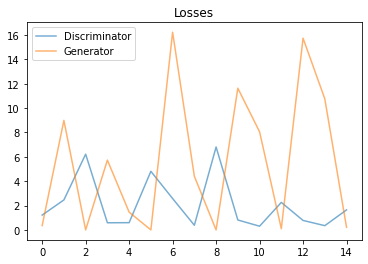

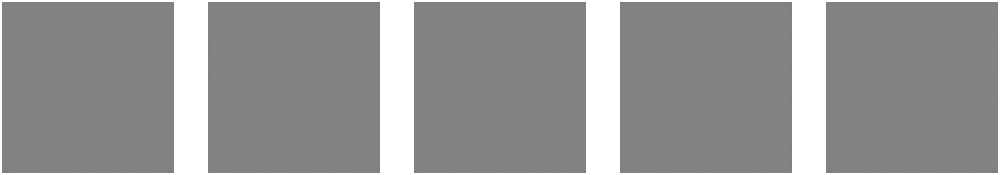

Epoch 2/100 
Duration: 173.80054 
D Loss: 1.32804 
G Loss: 7.38045


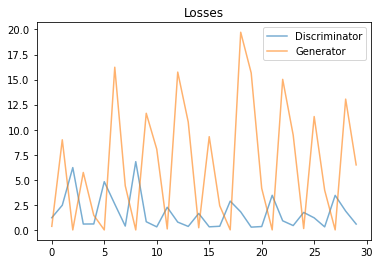

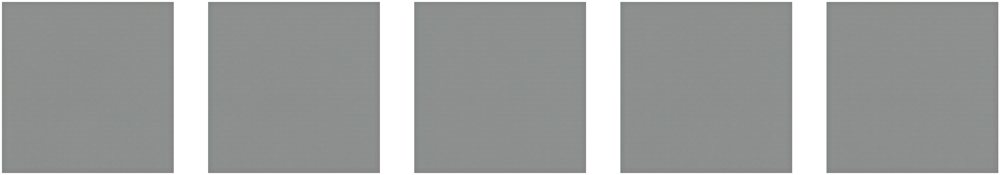

Epoch 3/100 
Duration: 172.80936 
D Loss: 0.54200 
G Loss: 2.21594


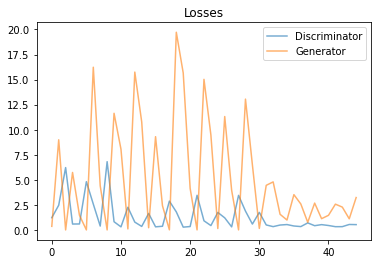

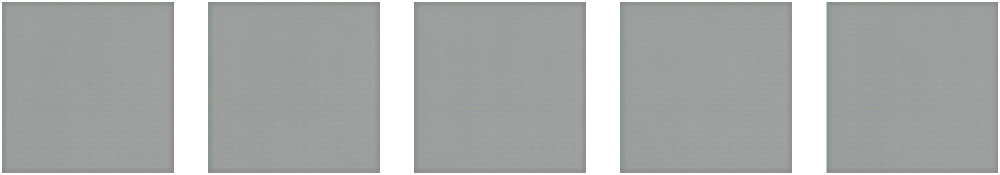

Epoch 4/100 
Duration: 172.55257 
D Loss: 0.40689 
G Loss: 2.25143


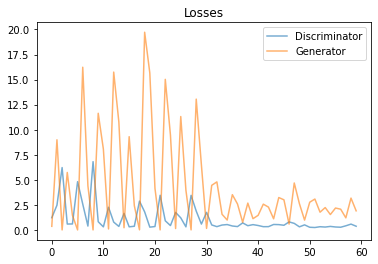

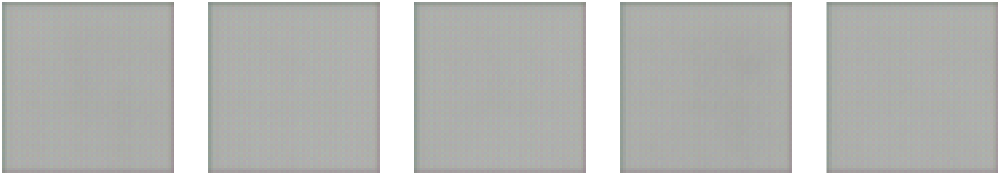

Epoch 5/100 
Duration: 171.58463 
D Loss: 0.52822 
G Loss: 2.28452


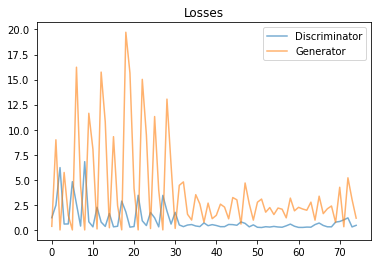

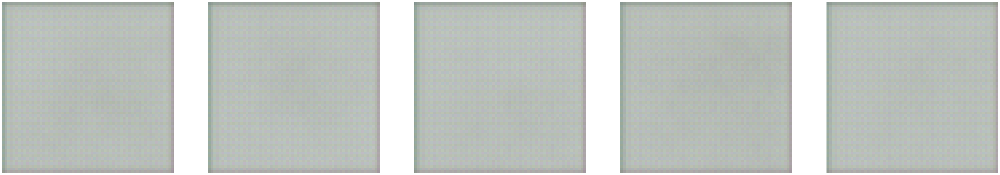

Epoch 6/100 
Duration: 171.44058 
D Loss: 0.38570 
G Loss: 2.12735


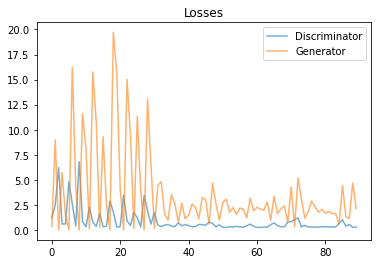

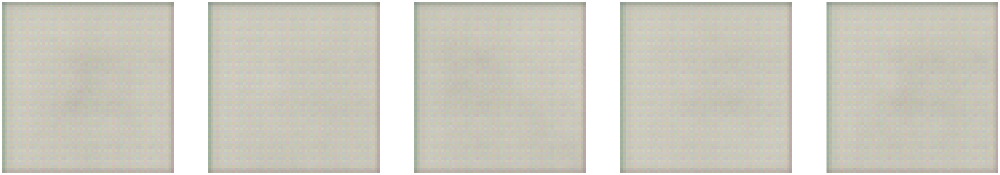

Epoch 7/100 
Duration: 171.19762 
D Loss: 0.58674 
G Loss: 2.32442


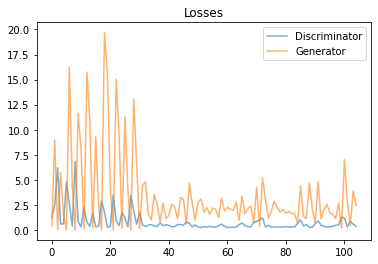

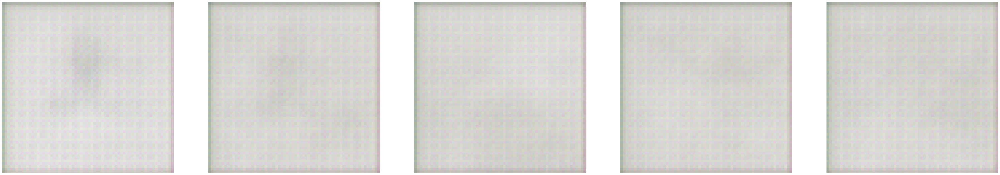

Epoch 8/100 
Duration: 171.17494 
D Loss: 0.38981 
G Loss: 1.77345


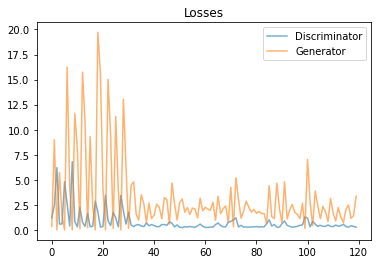

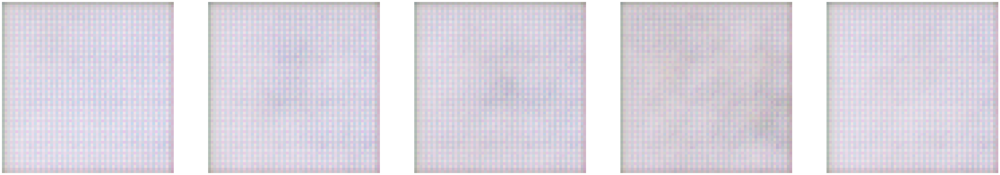

Epoch 9/100 
Duration: 170.31106 
D Loss: 0.53409 
G Loss: 2.12340


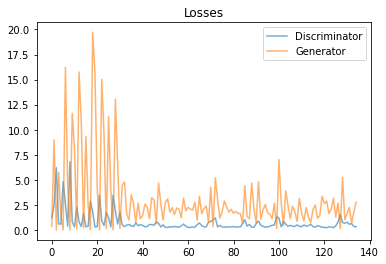

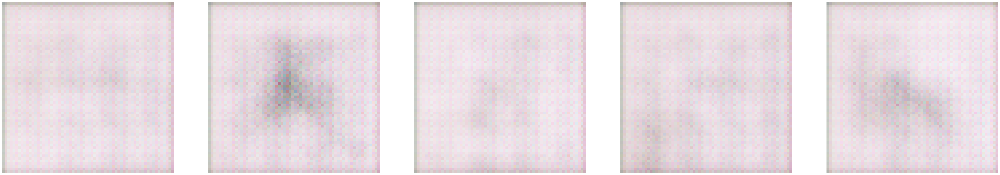

Epoch 10/100 
Duration: 170.47695 
D Loss: 0.48551 
G Loss: 2.51085


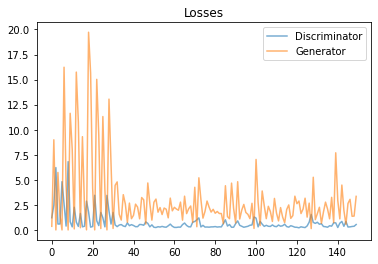

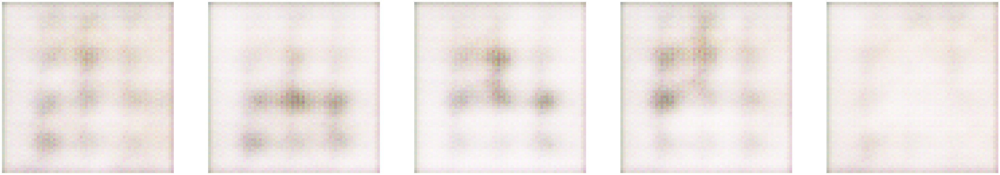

Epoch 11/100 
Duration: 171.29906 
D Loss: 0.43824 
G Loss: 1.98980


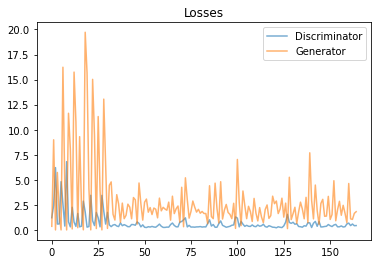

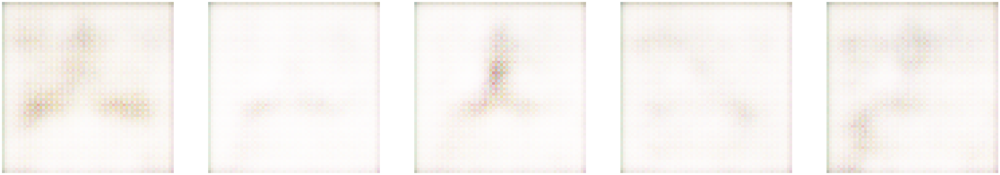

Epoch 12/100 
Duration: 171.53937 
D Loss: 0.62874 
G Loss: 1.76141


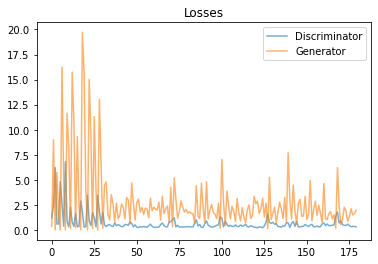

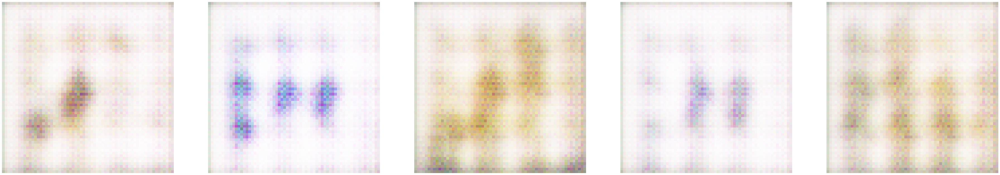

Epoch 13/100 
Duration: 171.53915 
D Loss: 0.57068 
G Loss: 2.00899


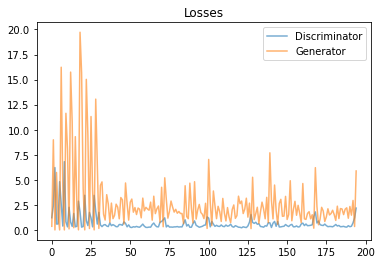

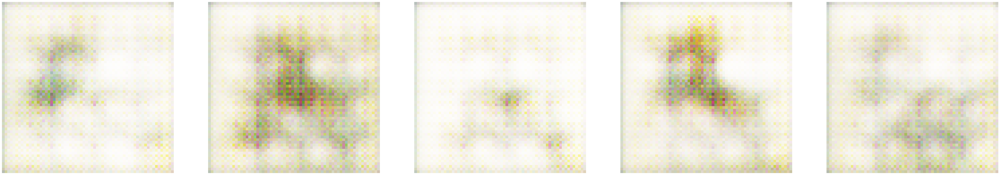

Epoch 14/100 
Duration: 172.25603 
D Loss: 0.47992 
G Loss: 1.40417


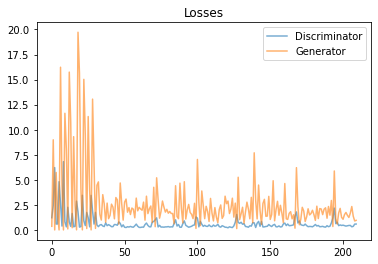

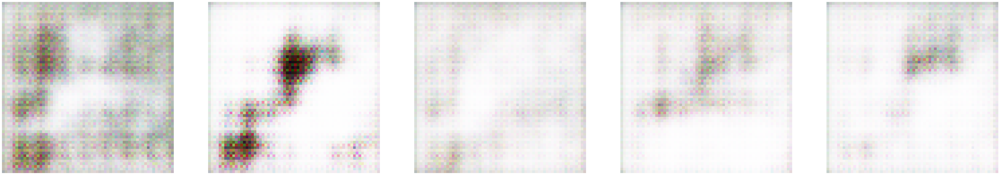

Epoch 15/100 
Duration: 171.31671 
D Loss: 0.50754 
G Loss: 1.51250


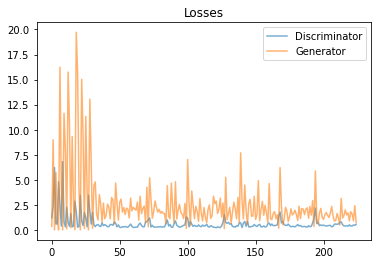

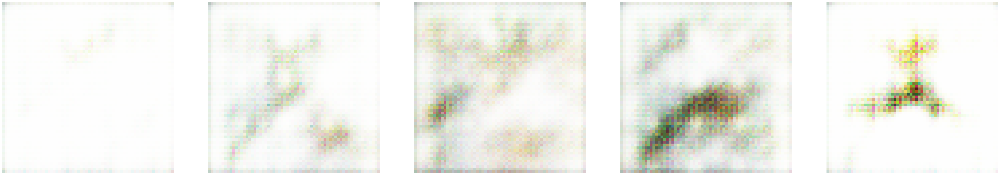

Epoch 16/100 
Duration: 171.19856 
D Loss: 0.55310 
G Loss: 1.71527


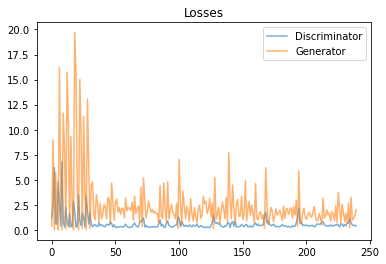

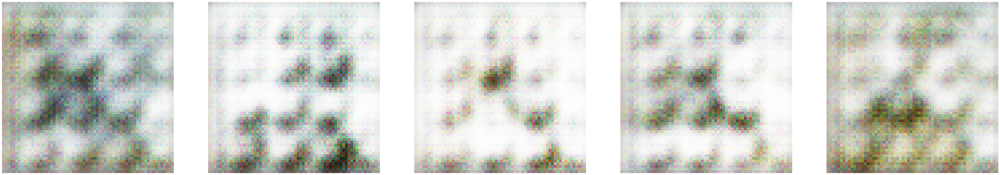

Epoch 17/100 
Duration: 169.90625 
D Loss: 0.50850 
G Loss: 2.01954


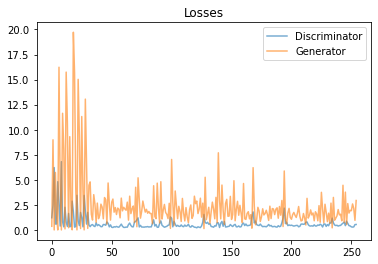

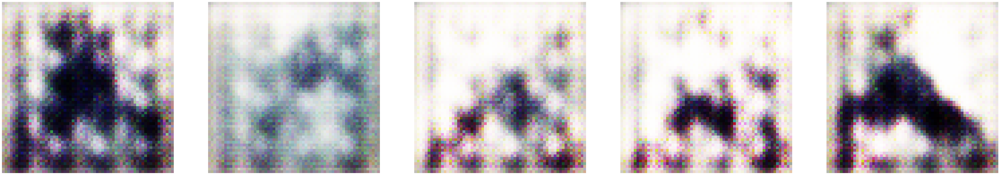

Epoch 18/100 
Duration: 171.74154 
D Loss: 0.53829 
G Loss: 1.74038


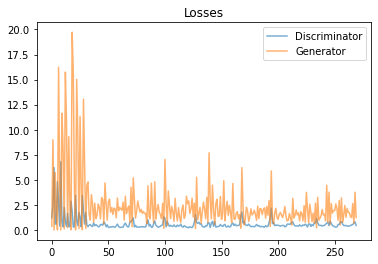

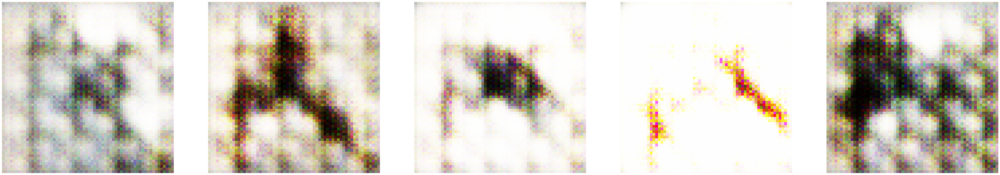

Epoch 19/100 
Duration: 171.76096 
D Loss: 0.48851 
G Loss: 1.81014


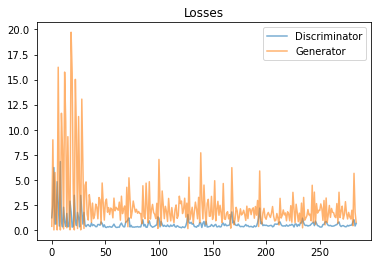

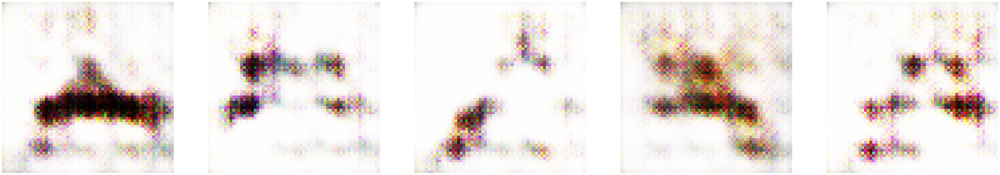

Epoch 20/100 
Duration: 174.36772 
D Loss: 0.45520 
G Loss: 1.83152


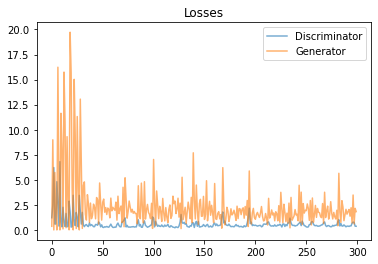

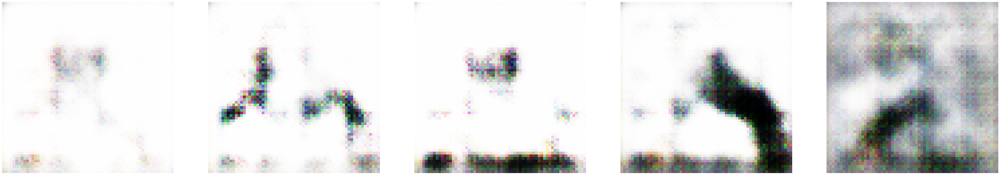

Epoch 21/100 
Duration: 173.77829 
D Loss: 0.43481 
G Loss: 1.78336


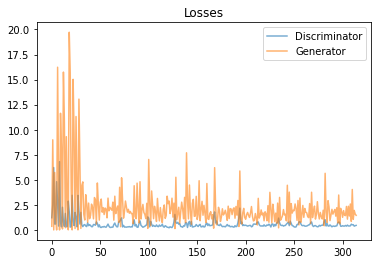

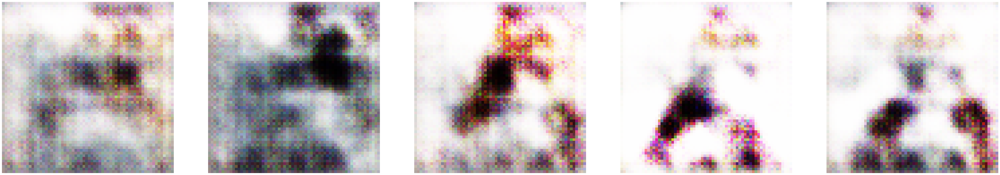

Epoch 22/100 
Duration: 174.26842 
D Loss: 0.57833 
G Loss: 1.76419


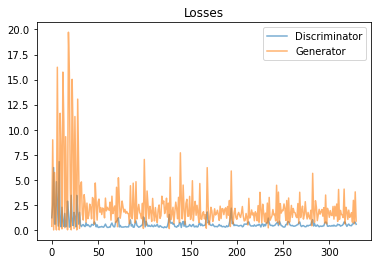

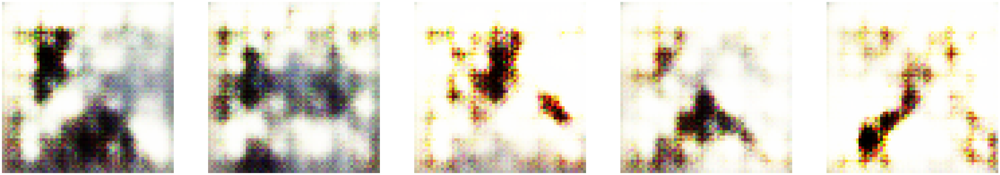

Epoch 23/100 
Duration: 173.86956 
D Loss: 0.45567 
G Loss: 1.81618


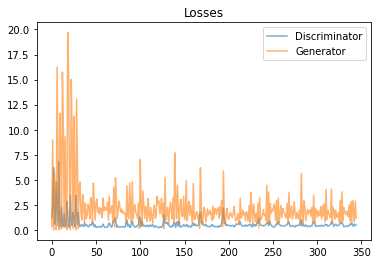

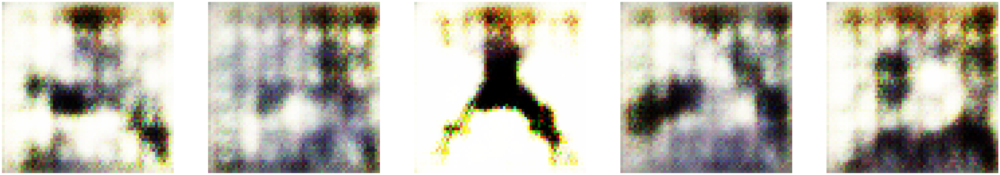

Epoch 24/100 
Duration: 175.18518 
D Loss: 0.45943 
G Loss: 1.84607


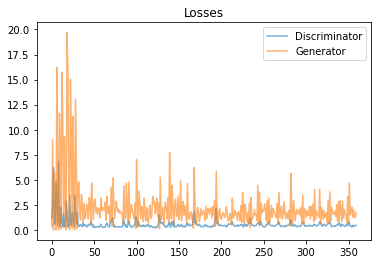

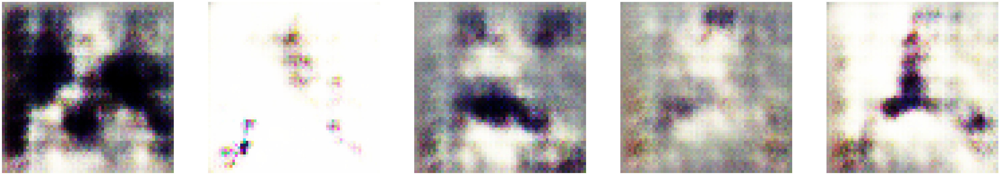

Epoch 25/100 
Duration: 173.57345 
D Loss: 0.58134 
G Loss: 2.15068


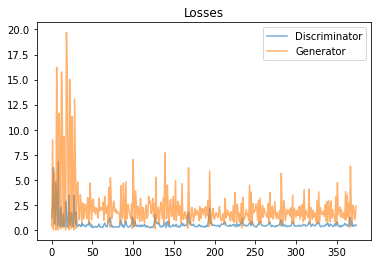

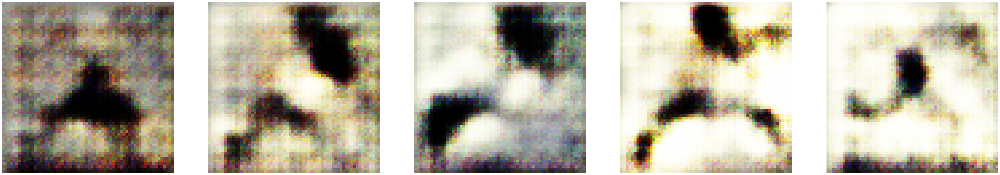

Epoch 26/100 
Duration: 174.88291 
D Loss: 0.47578 
G Loss: 1.91369


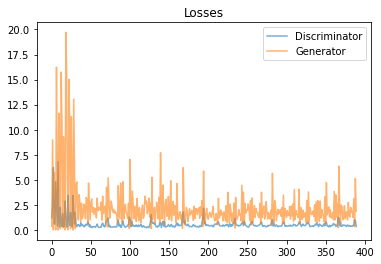

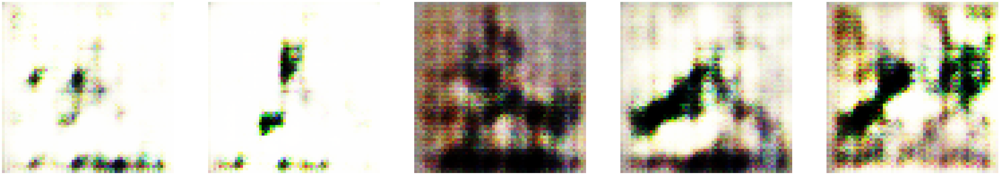

Epoch 27/100 
Duration: 170.33922 
D Loss: 0.44107 
G Loss: 1.84264


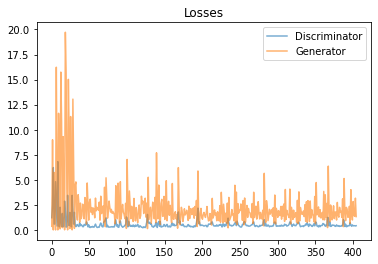

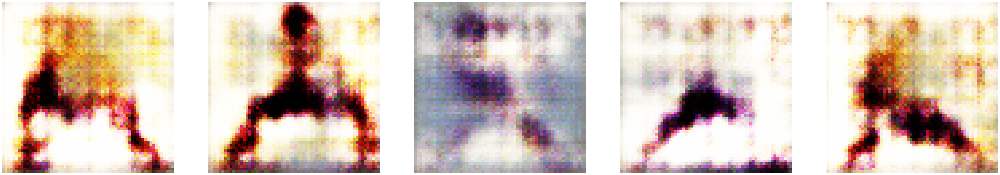

Epoch 28/100 
Duration: 172.10309 
D Loss: 0.41084 
G Loss: 1.92178


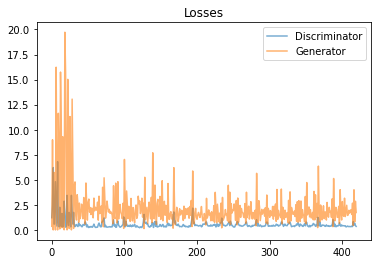

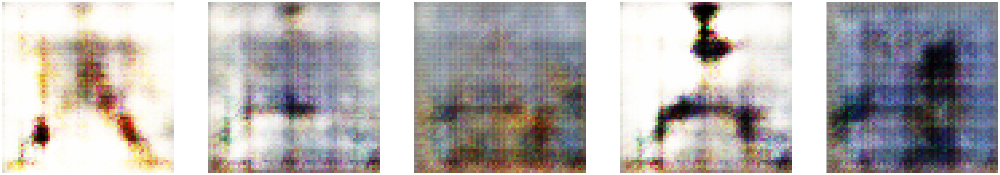

Epoch 29/100 
Duration: 173.06105 
D Loss: 0.43373 
G Loss: 2.10200


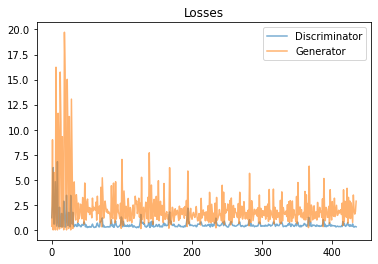

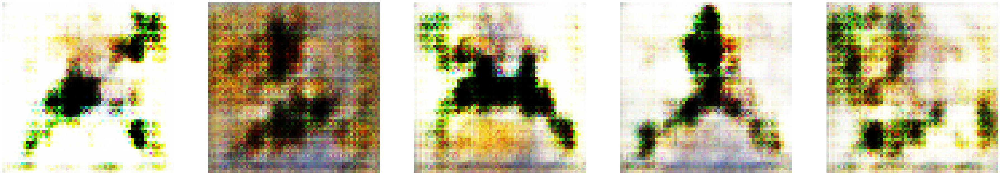

Epoch 30/100 
Duration: 173.36690 
D Loss: 0.44240 
G Loss: 2.13671


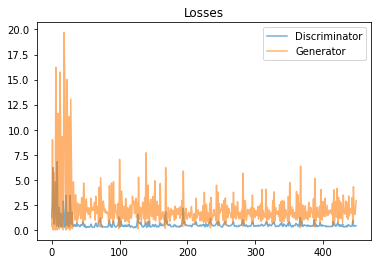

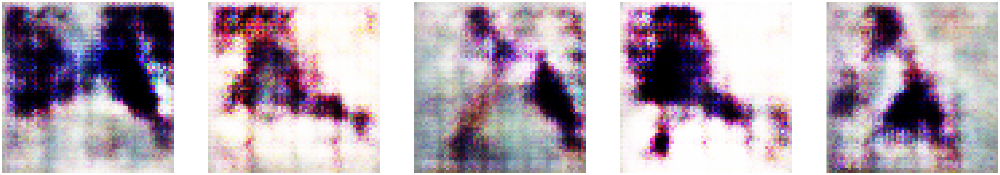

Epoch 31/100 
Duration: 173.07899 
D Loss: 0.41706 
G Loss: 1.93519


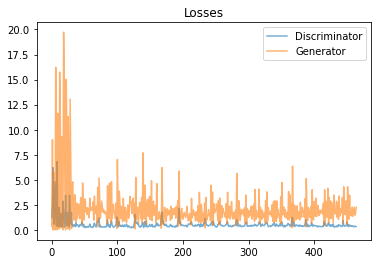

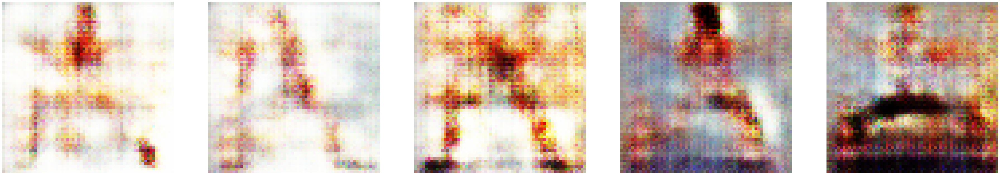

Epoch 32/100 
Duration: 172.93516 
D Loss: 0.52536 
G Loss: 2.14447


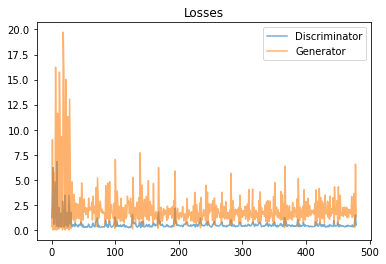

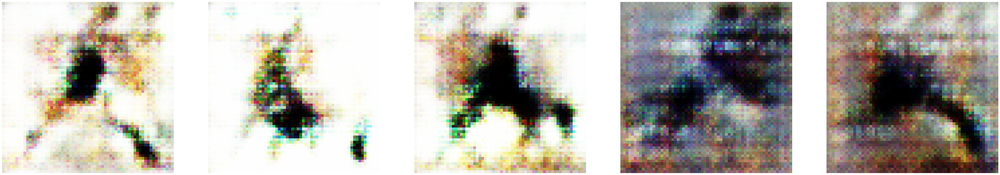

Epoch 33/100 
Duration: 171.86117 
D Loss: 0.47326 
G Loss: 1.81148


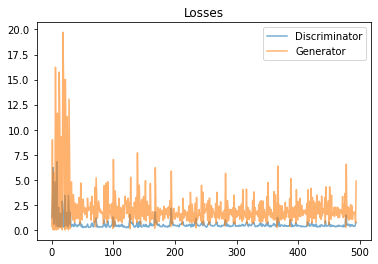

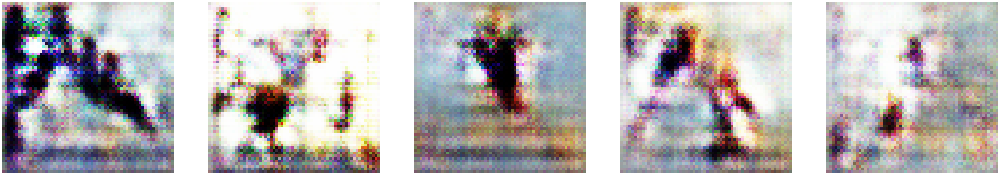

Epoch 34/100 
Duration: 171.35040 
D Loss: 0.40573 
G Loss: 1.86745


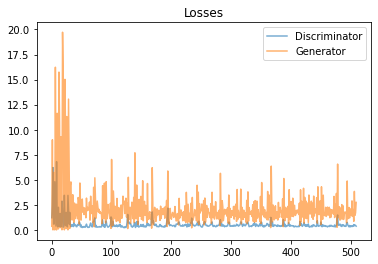

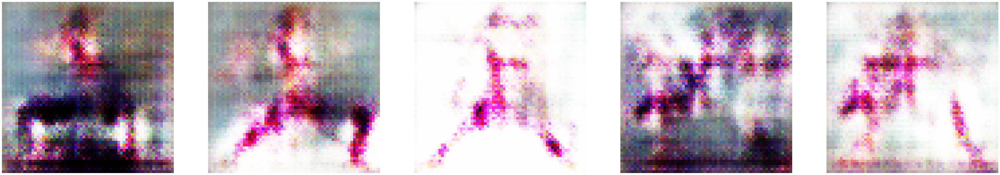

Epoch 35/100 
Duration: 171.43367 
D Loss: 0.41787 
G Loss: 2.03510


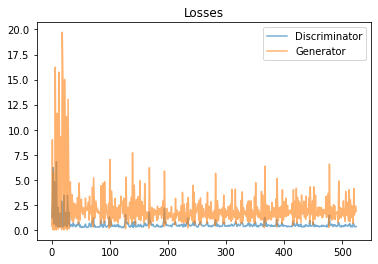

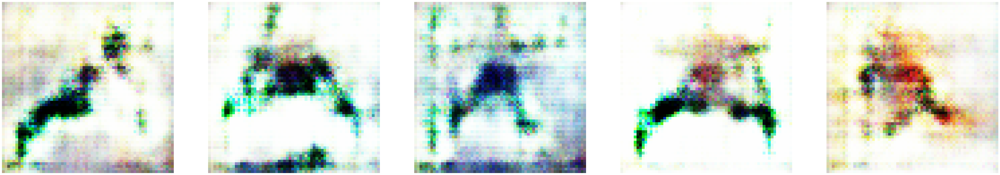

Epoch 36/100 
Duration: 171.50239 
D Loss: 0.39980 
G Loss: 1.85704


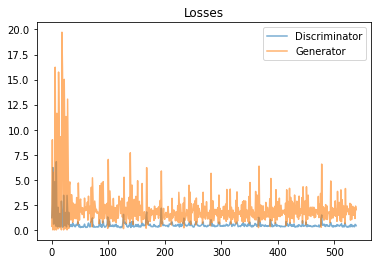

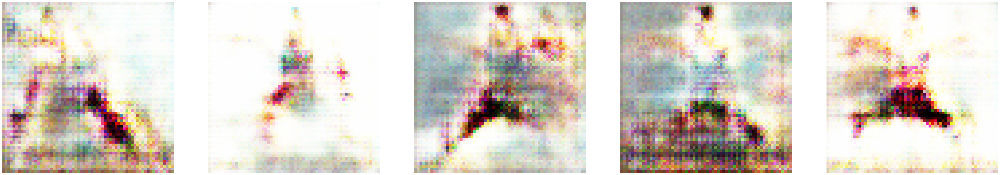

Epoch 37/100 
Duration: 172.04904 
D Loss: 0.43148 
G Loss: 2.14654


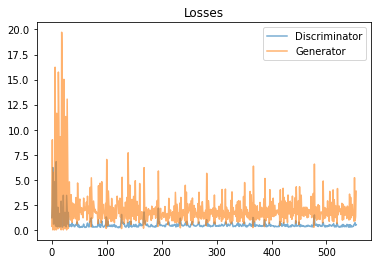

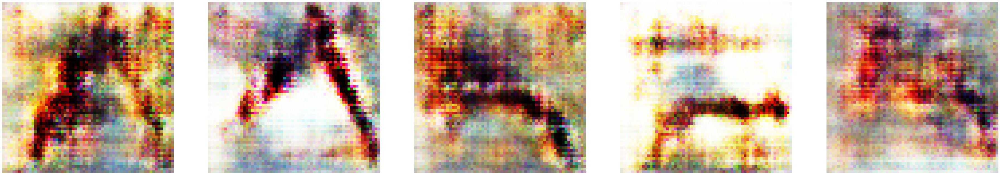

Epoch 38/100 
Duration: 172.34658 
D Loss: 0.53107 
G Loss: 2.35705


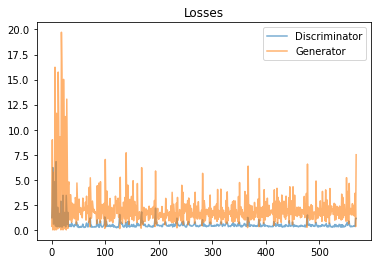

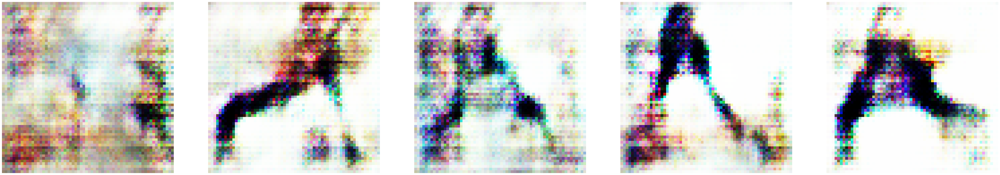

Epoch 39/100 
Duration: 173.15384 
D Loss: 0.36365 
G Loss: 1.92280


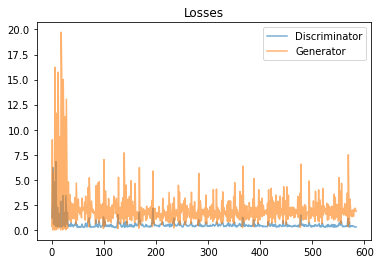

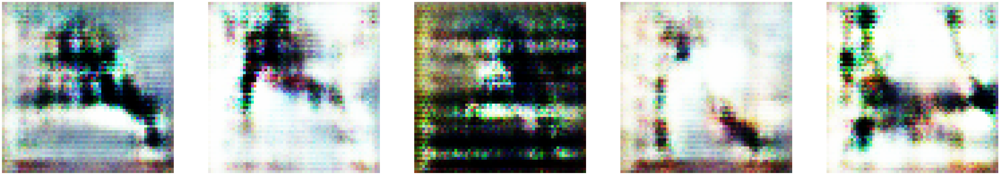

Epoch 40/100 
Duration: 171.70691 
D Loss: 0.40695 
G Loss: 2.23746


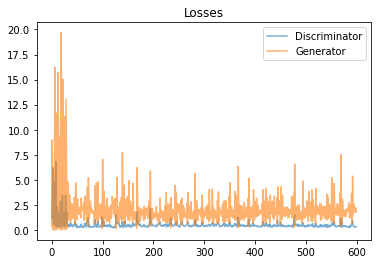

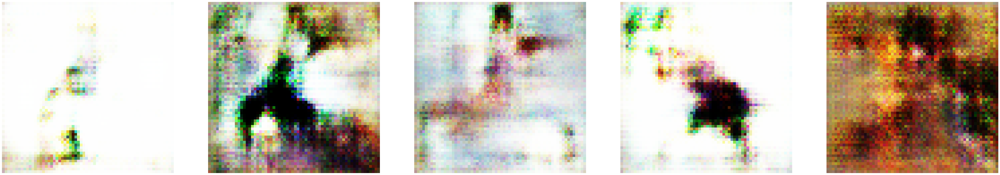

Epoch 41/100 
Duration: 172.70013 
D Loss: 0.39266 
G Loss: 2.01778


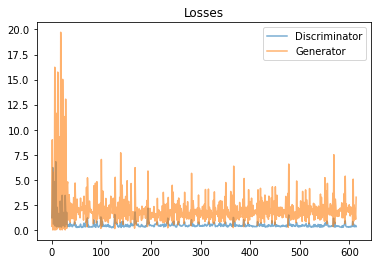

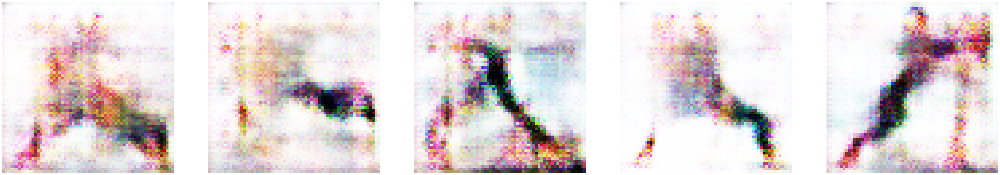

Epoch 42/100 
Duration: 172.70615 
D Loss: 0.43625 
G Loss: 1.98665


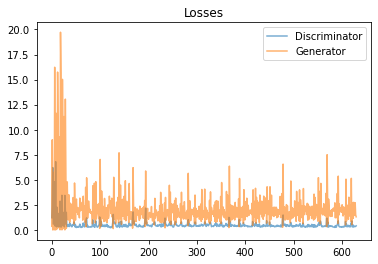

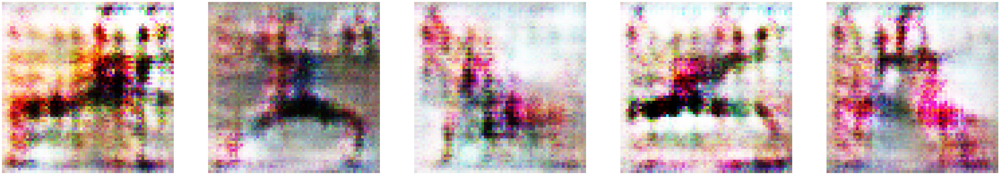

Epoch 43/100 
Duration: 172.71681 
D Loss: 0.45089 
G Loss: 2.15595


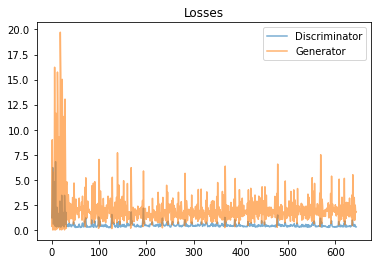

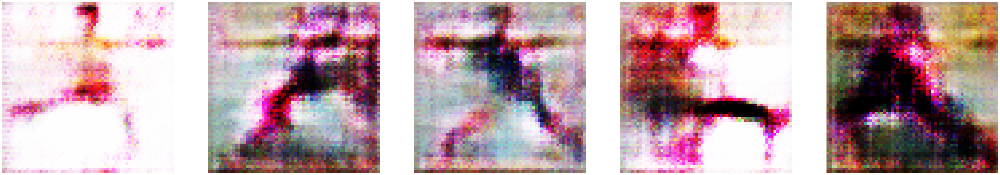

Epoch 44/100 
Duration: 172.20260 
D Loss: 0.36913 
G Loss: 2.19052


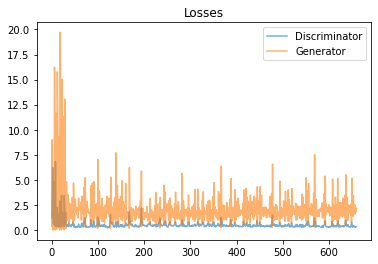

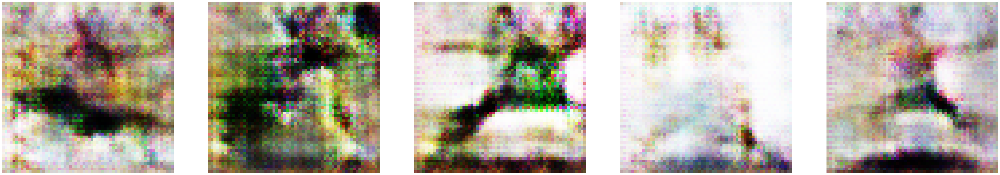

Epoch 45/100 
Duration: 173.54917 
D Loss: 0.38424 
G Loss: 2.33073


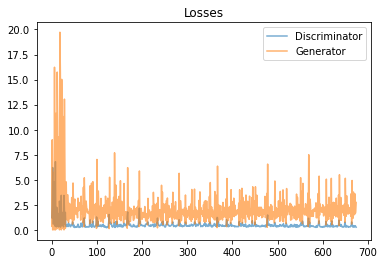

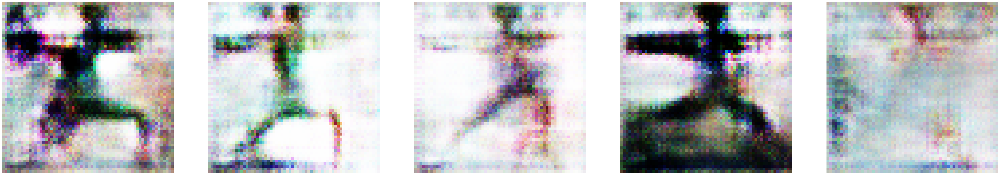

Epoch 46/100 
Duration: 174.02083 
D Loss: 0.39455 
G Loss: 2.09315


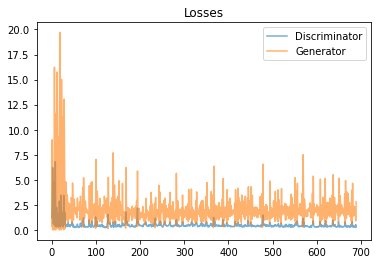

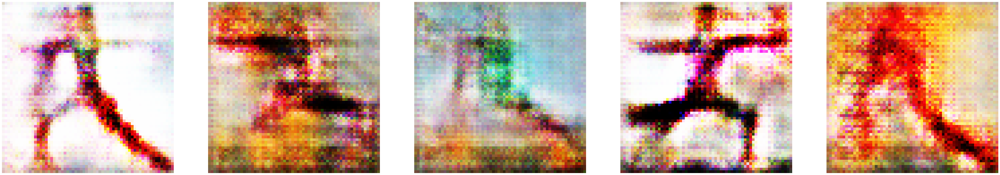

Epoch 47/100 
Duration: 172.36927 
D Loss: 0.34918 
G Loss: 2.29121


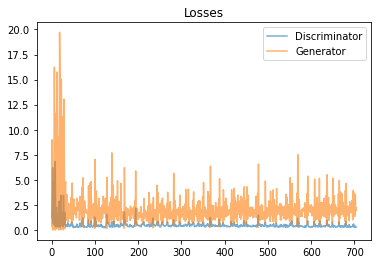

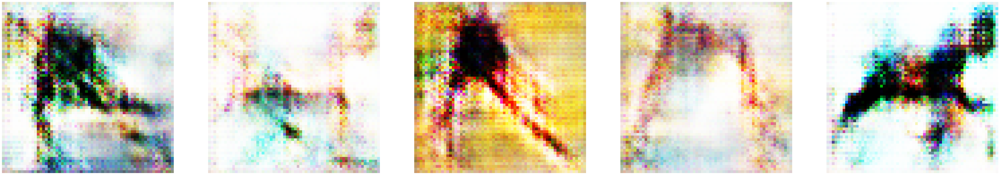

Epoch 48/100 
Duration: 172.87275 
D Loss: 0.54811 
G Loss: 2.32106


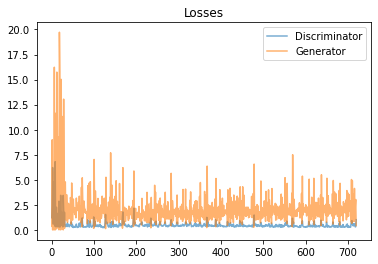

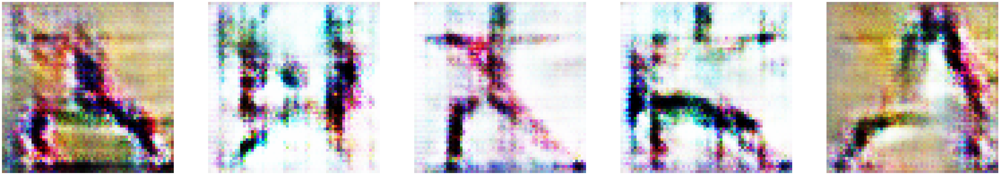

Epoch 49/100 
Duration: 172.41397 
D Loss: 0.37449 
G Loss: 2.14259


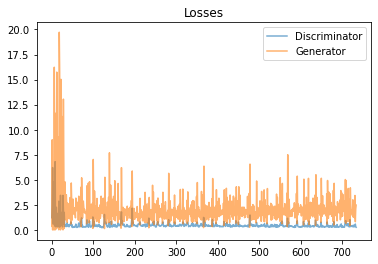

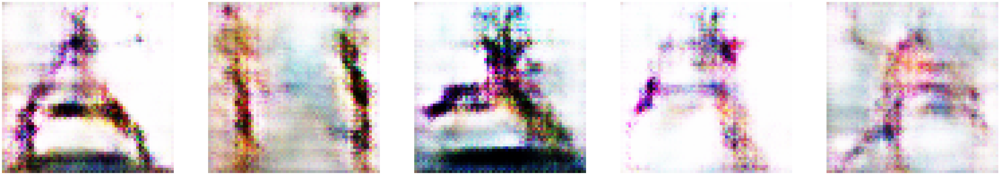

Epoch 50/100 
Duration: 172.57598 
D Loss: 0.43055 
G Loss: 2.28450


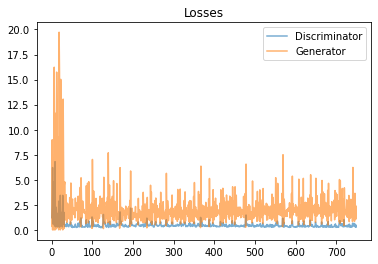

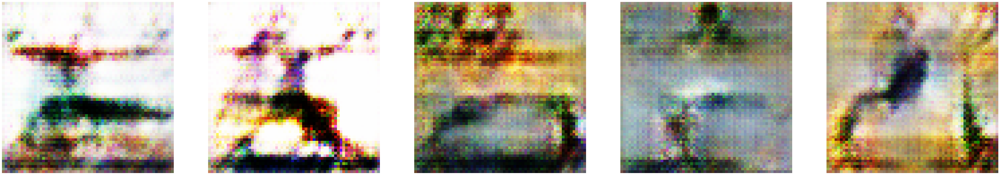

Epoch 51/100 
Duration: 173.76814 
D Loss: 0.33950 
G Loss: 2.11774


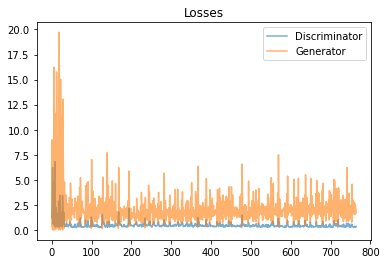

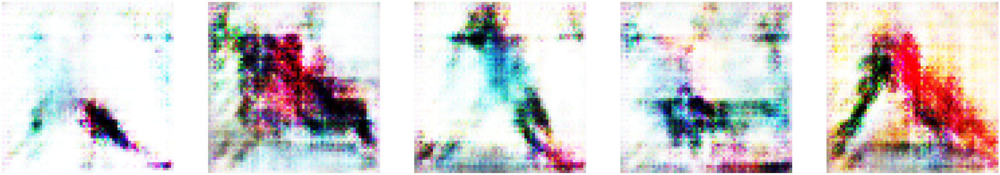

Epoch 52/100 
Duration: 175.01896 
D Loss: 0.32354 
G Loss: 2.31927


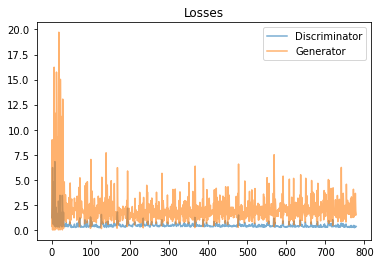

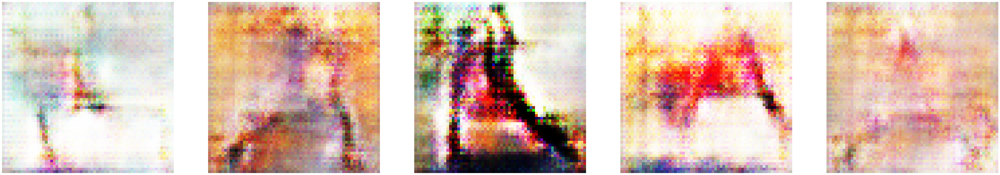

Epoch 53/100 
Duration: 176.66900 
D Loss: 0.32857 
G Loss: 2.25787


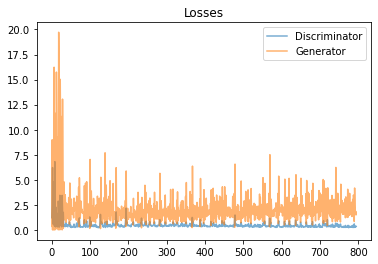

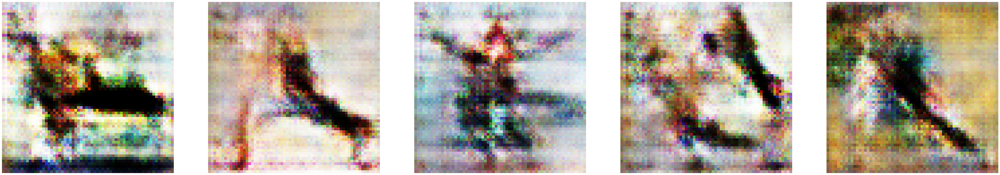

Epoch 54/100 
Duration: 174.19610 
D Loss: 0.36261 
G Loss: 2.30763


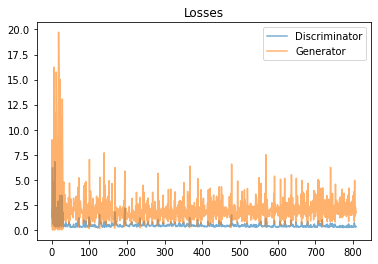

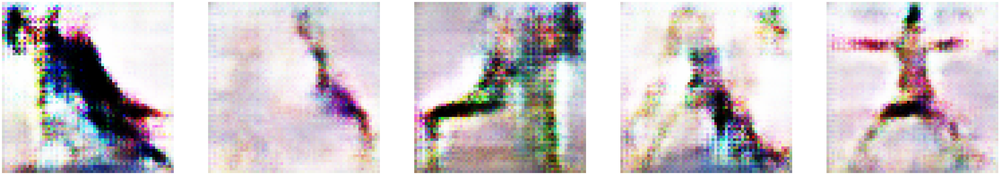

Epoch 55/100 
Duration: 173.78782 
D Loss: 0.44925 
G Loss: 2.71073


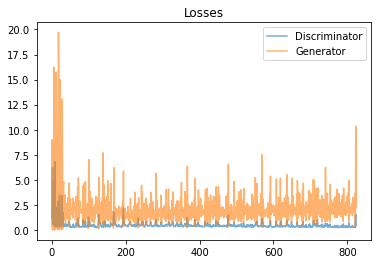

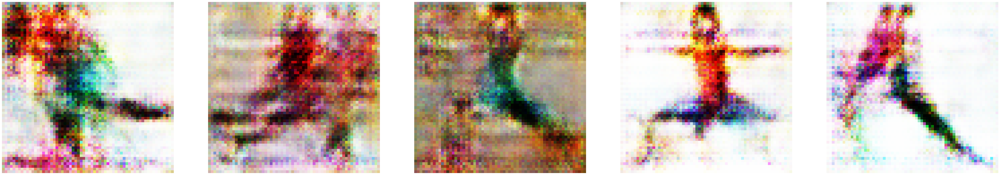

Epoch 56/100 
Duration: 174.00229 
D Loss: 0.53602 
G Loss: 1.98912


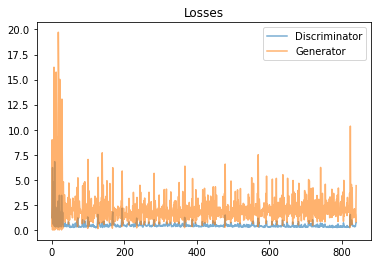

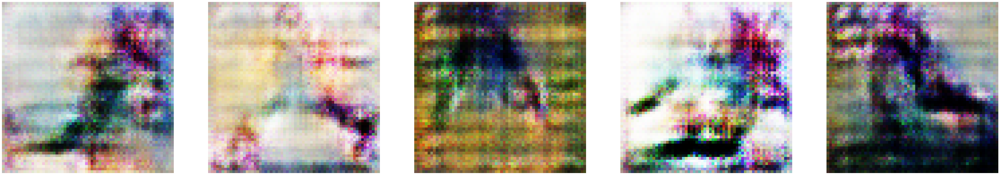

Epoch 57/100 
Duration: 172.66469 
D Loss: 0.38813 
G Loss: 1.98724


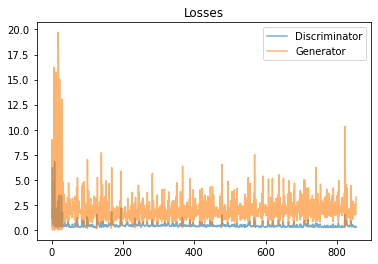

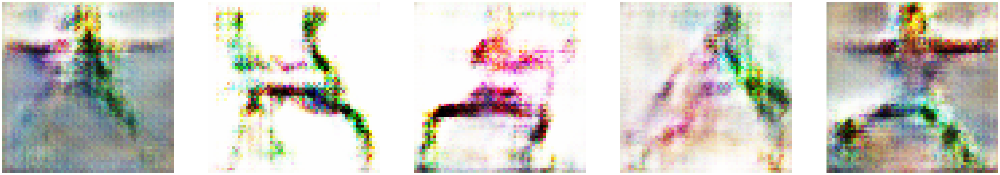

Epoch 58/100 
Duration: 174.46991 
D Loss: 0.28949 
G Loss: 2.10559


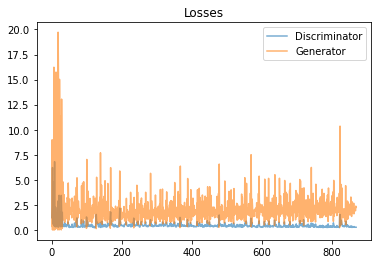

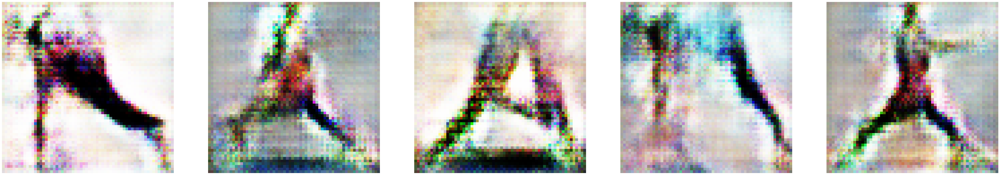

Epoch 59/100 
Duration: 175.45014 
D Loss: 0.29351 
G Loss: 2.33637


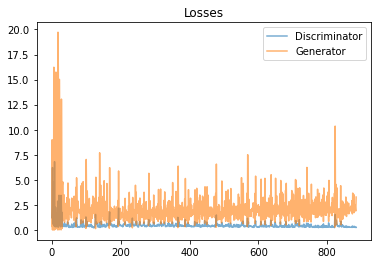

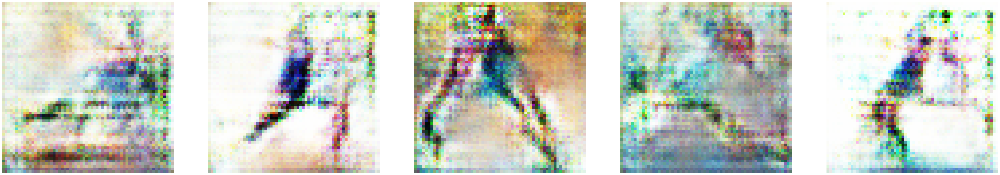

Epoch 60/100 
Duration: 175.74641 
D Loss: 0.35878 
G Loss: 2.46074


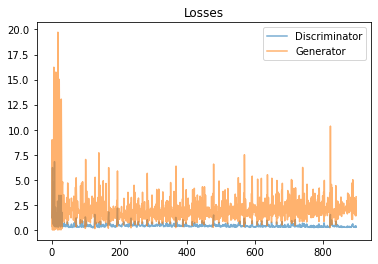

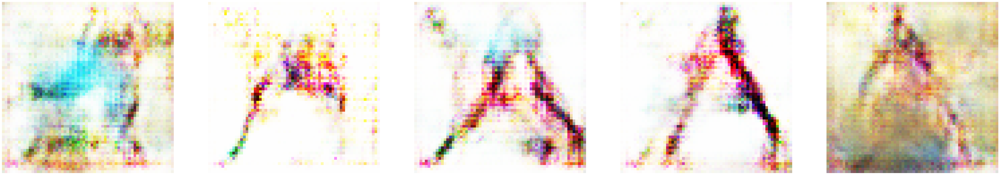

Epoch 61/100 
Duration: 176.03604 
D Loss: 0.36532 
G Loss: 2.44859


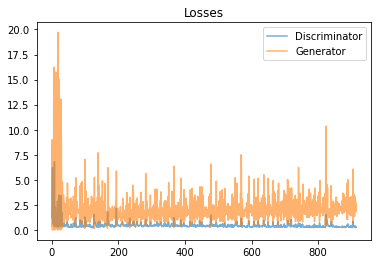

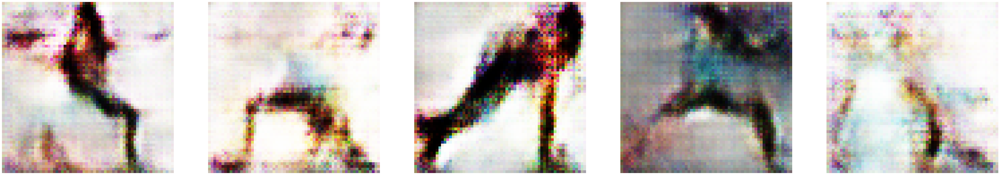

Epoch 62/100 
Duration: 174.84868 
D Loss: 0.31355 
G Loss: 2.25517


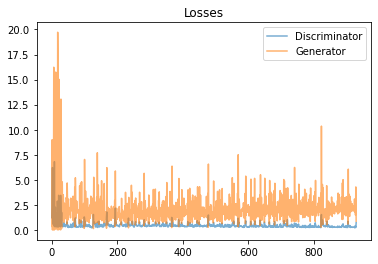

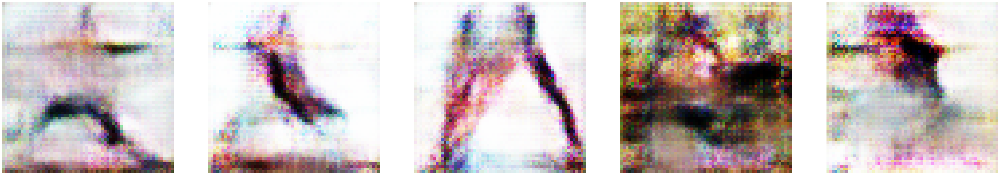

Epoch 63/100 
Duration: 175.51484 
D Loss: 0.42799 
G Loss: 2.60159


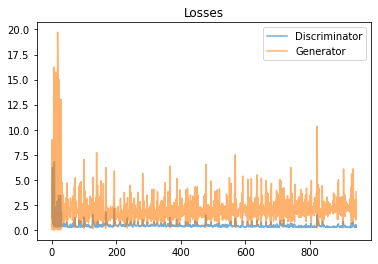

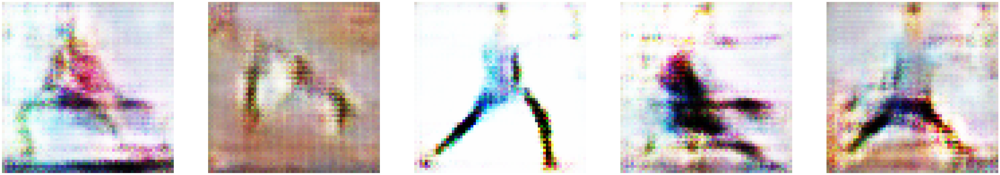

Epoch 64/100 
Duration: 173.82264 
D Loss: 0.35250 
G Loss: 2.40260


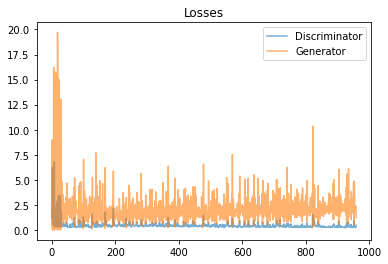

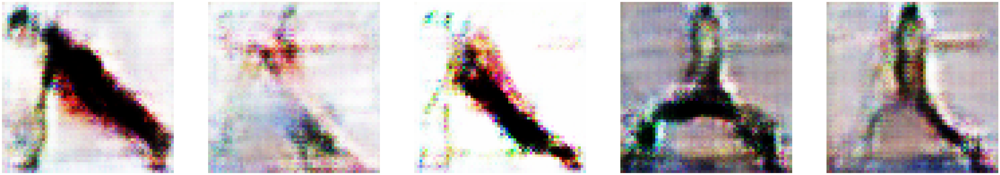

Epoch 65/100 
Duration: 175.32819 
D Loss: 0.32102 
G Loss: 2.46601


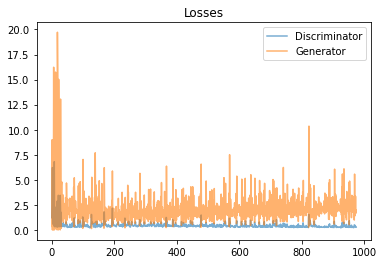

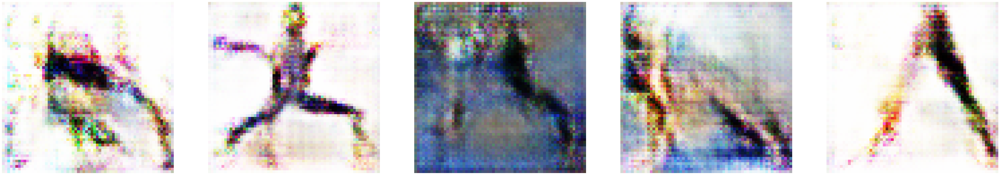

Epoch 66/100 
Duration: 176.21419 
D Loss: 0.28685 
G Loss: 2.45787


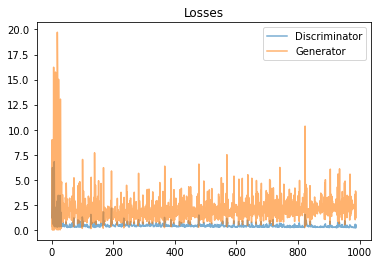

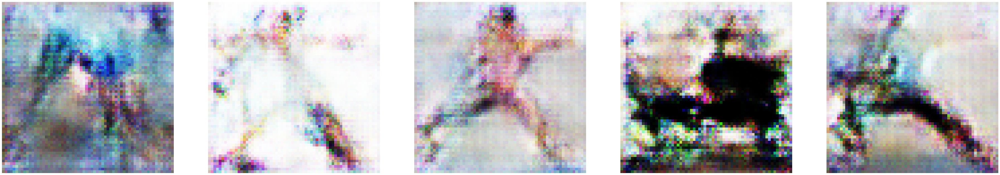

Epoch 67/100 
Duration: 176.71455 
D Loss: 0.32659 
G Loss: 2.70699


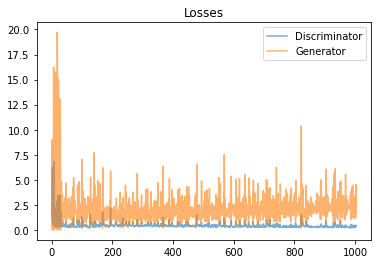

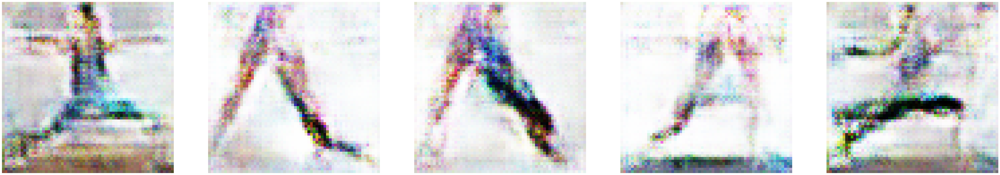

Epoch 68/100 
Duration: 175.43804 
D Loss: 0.62584 
G Loss: 2.37802


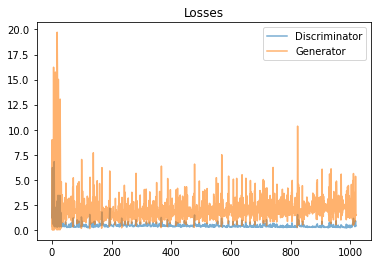

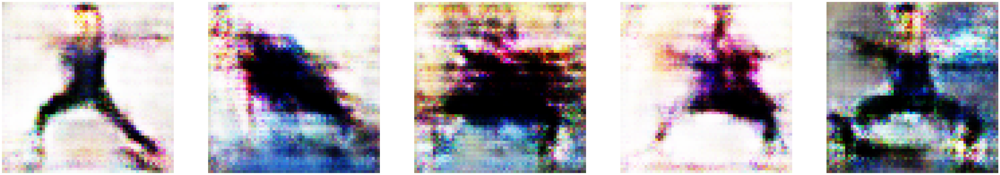

Epoch 69/100 
Duration: 174.36462 
D Loss: 0.32712 
G Loss: 2.13129


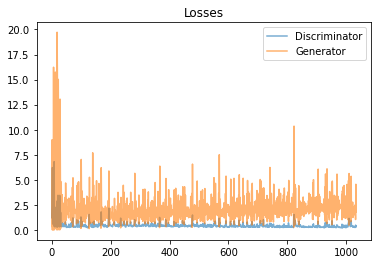

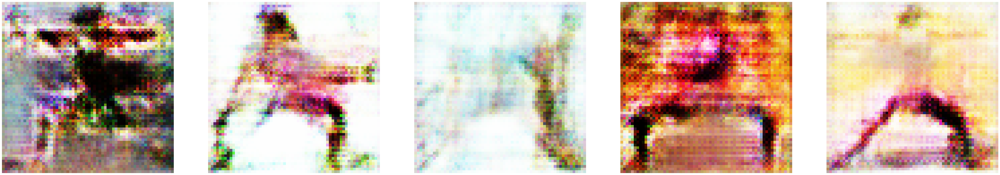

Epoch 70/100 
Duration: 174.10147 
D Loss: 0.25777 
G Loss: 2.45260


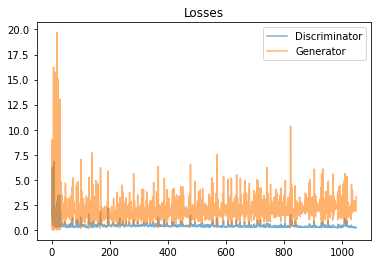

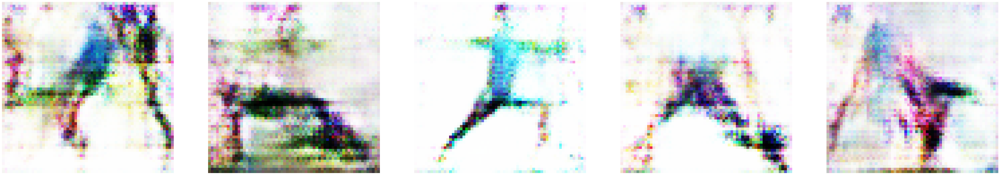

Epoch 71/100 
Duration: 175.90353 
D Loss: 0.28692 
G Loss: 2.67163


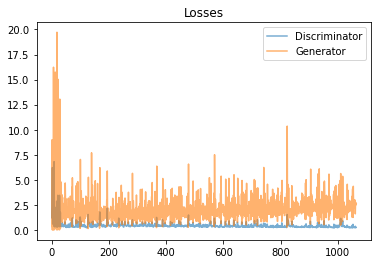

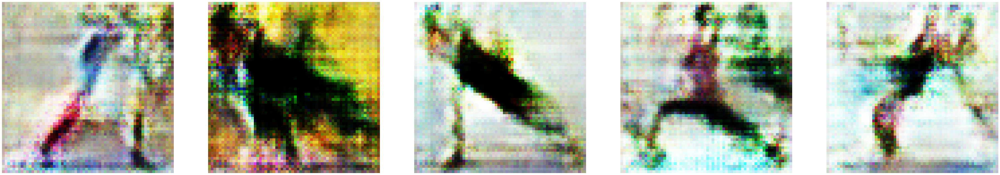

Epoch 72/100 
Duration: 175.70958 
D Loss: 0.25069 
G Loss: 2.48156


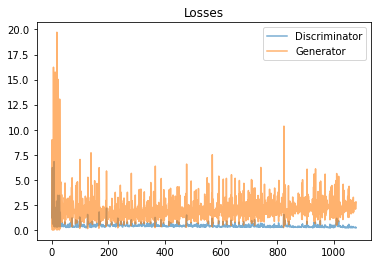

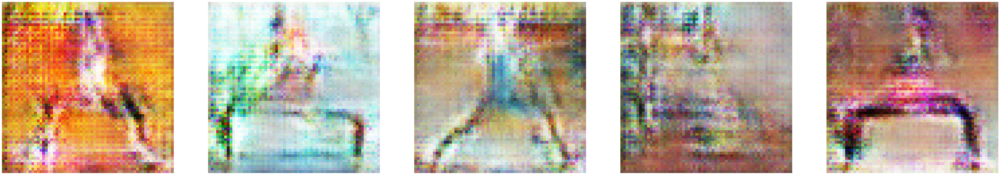

Epoch 73/100 
Duration: 174.73658 
D Loss: 0.23256 
G Loss: 2.70092


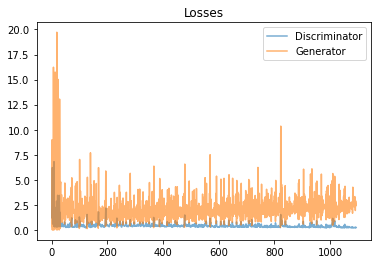

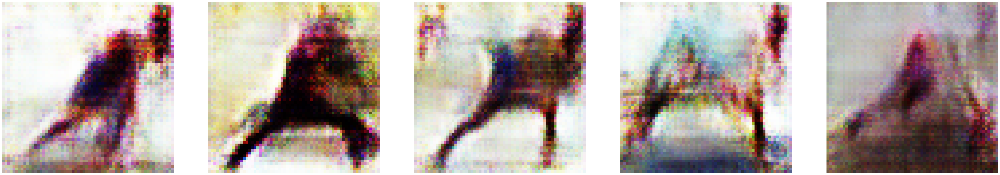

Epoch 74/100 
Duration: 175.33032 
D Loss: 0.39212 
G Loss: 2.87310


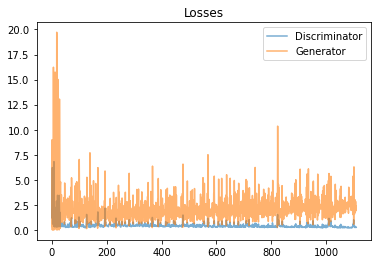

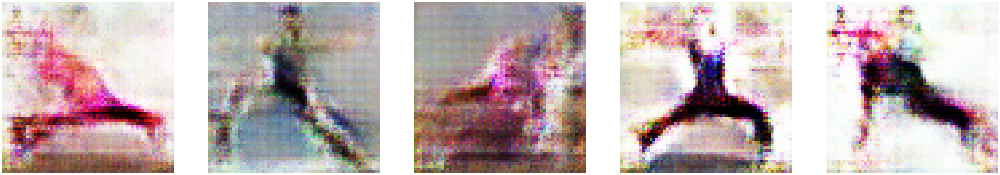

Epoch 75/100 
Duration: 176.14450 
D Loss: 0.33815 
G Loss: 2.59492


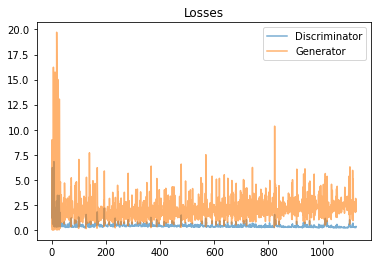

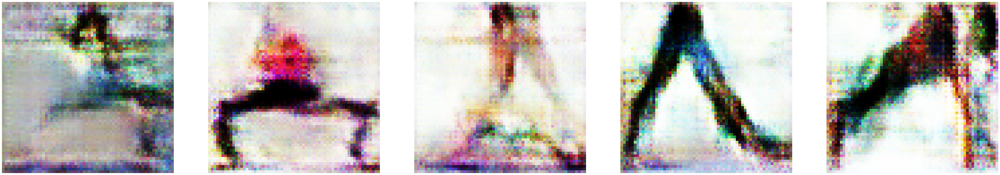

Epoch 76/100 
Duration: 173.51001 
D Loss: 0.26312 
G Loss: 2.60482


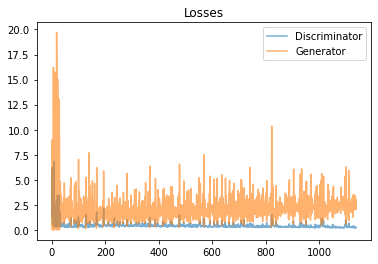

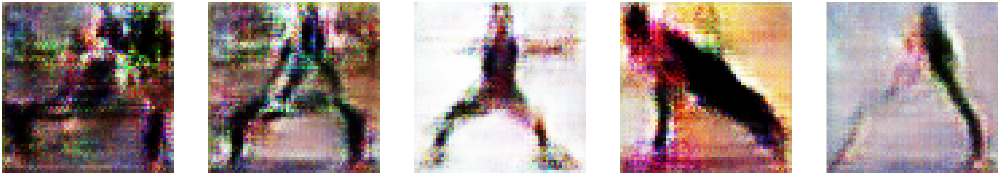

Epoch 77/100 
Duration: 173.33599 
D Loss: 0.56159 
G Loss: 2.53755


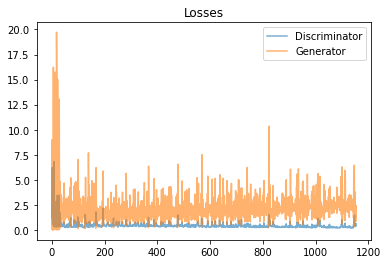

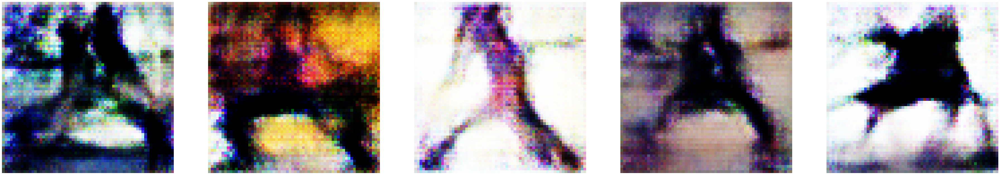

Epoch 78/100 
Duration: 175.61199 
D Loss: 0.33282 
G Loss: 2.25227


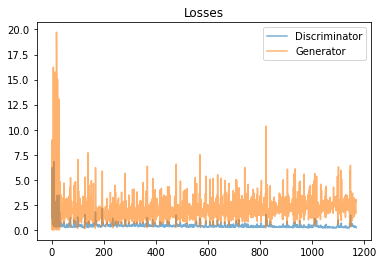

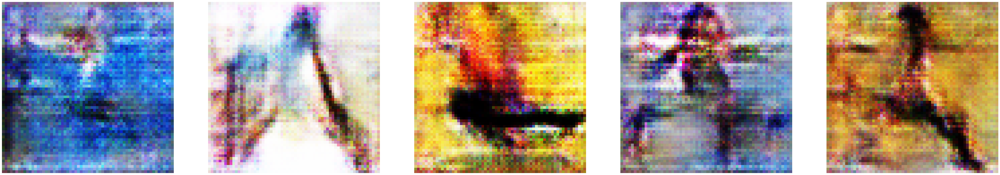

Epoch 79/100 
Duration: 174.92431 
D Loss: 0.29621 
G Loss: 2.61671


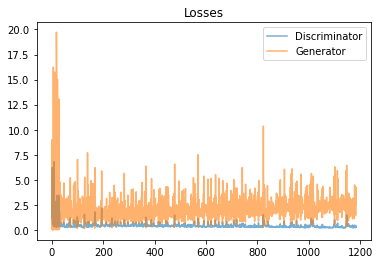

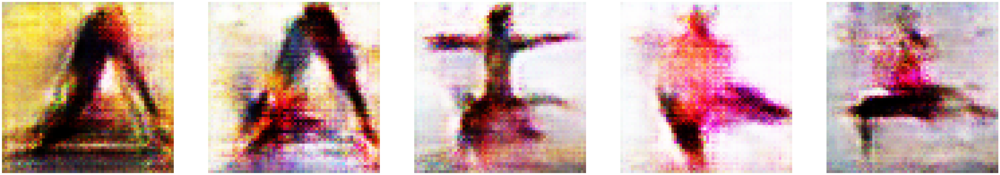

Epoch 80/100 
Duration: 175.05428 
D Loss: 0.26561 
G Loss: 2.57720


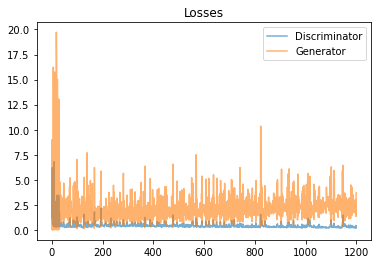

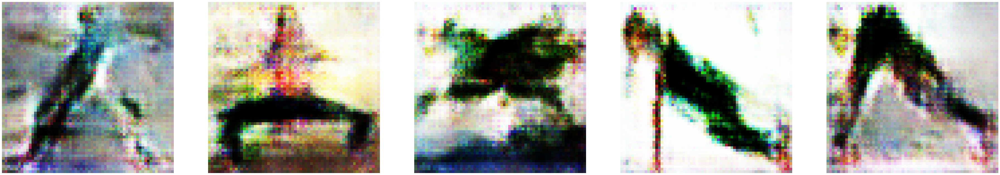

Epoch 81/100 
Duration: 175.03716 
D Loss: 0.24518 
G Loss: 2.63281


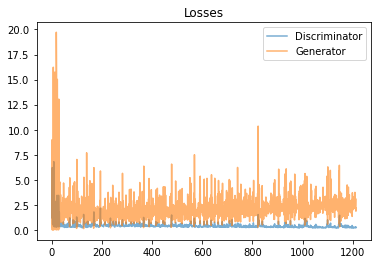

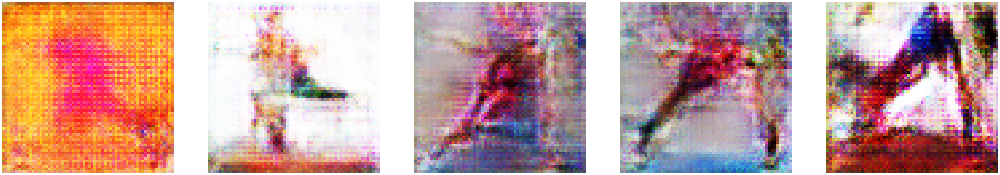

Epoch 82/100 
Duration: 174.77201 
D Loss: 0.28014 
G Loss: 2.76970


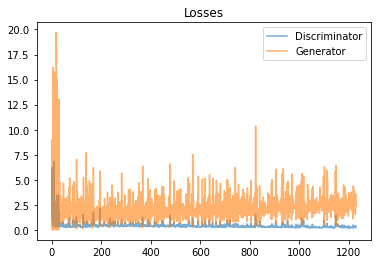

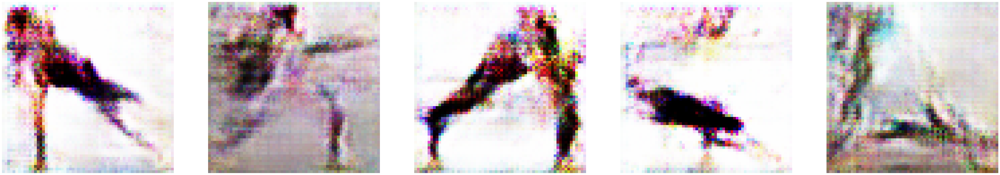

Epoch 83/100 
Duration: 174.68683 
D Loss: 0.30537 
G Loss: 2.81583


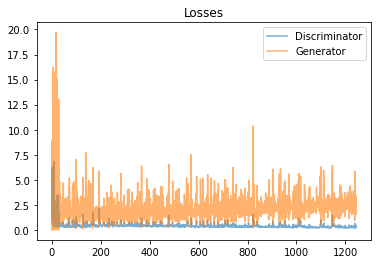

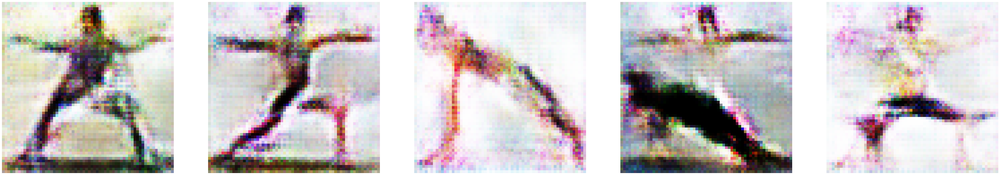

Epoch 84/100 
Duration: 173.45429 
D Loss: 0.36249 
G Loss: 2.88833


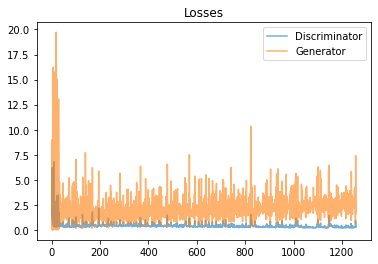

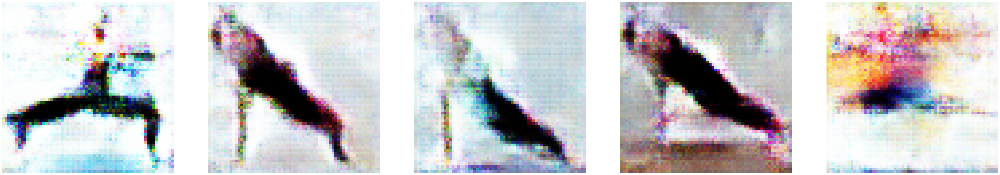

Epoch 85/100 
Duration: 174.23602 
D Loss: 0.38531 
G Loss: 2.64180


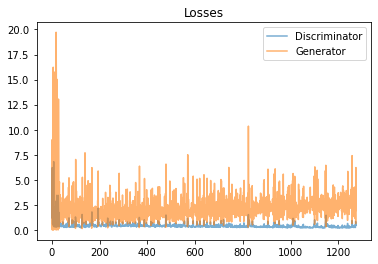

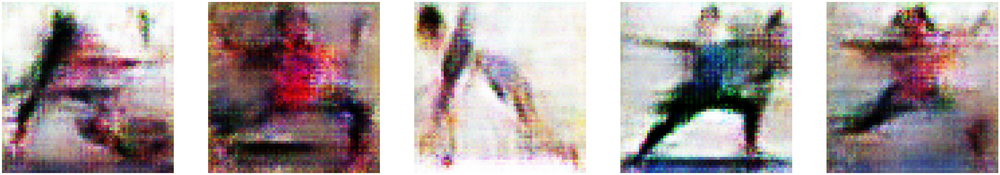

Epoch 86/100 
Duration: 174.53829 
D Loss: 0.27461 
G Loss: 2.50452


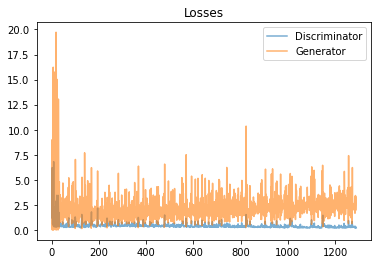

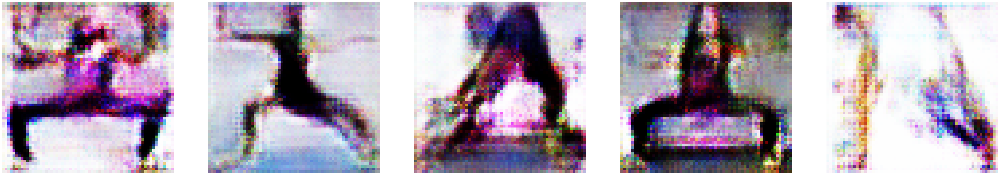

Epoch 87/100 
Duration: 174.98919 
D Loss: 0.25563 
G Loss: 2.87097


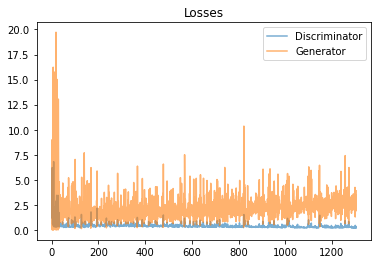

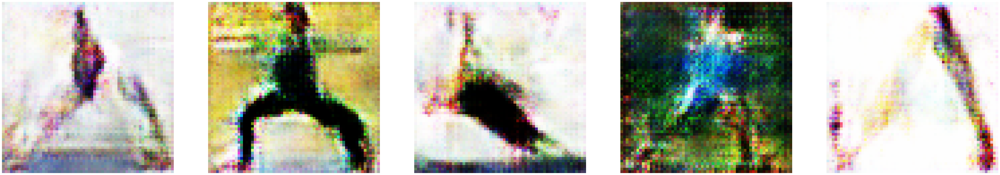

Epoch 88/100 
Duration: 175.33939 
D Loss: 0.26081 
G Loss: 2.72444


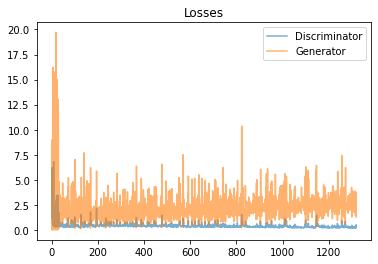

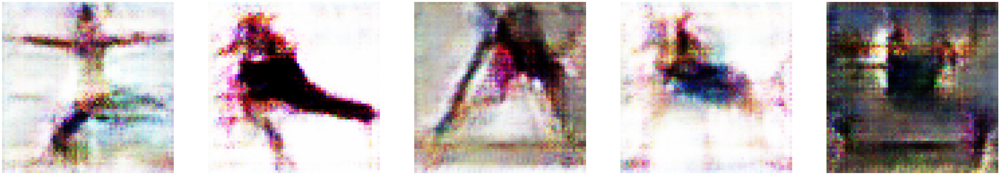

Epoch 89/100 
Duration: 175.43763 
D Loss: 0.25878 
G Loss: 2.81788


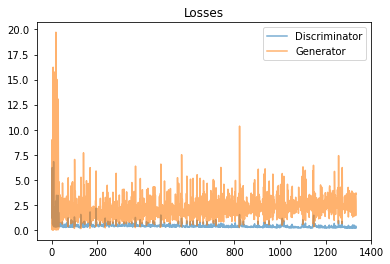

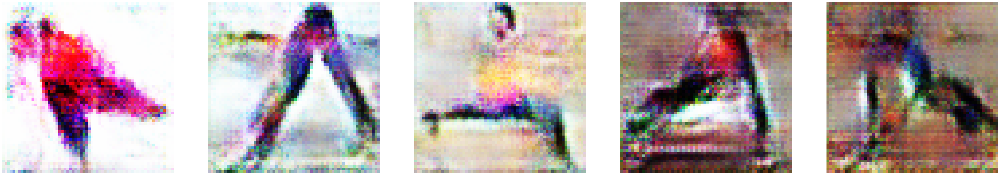

Epoch 90/100 
Duration: 174.19225 
D Loss: 0.27136 
G Loss: 3.10867


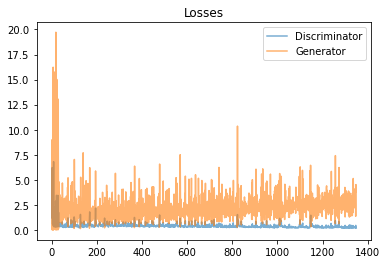

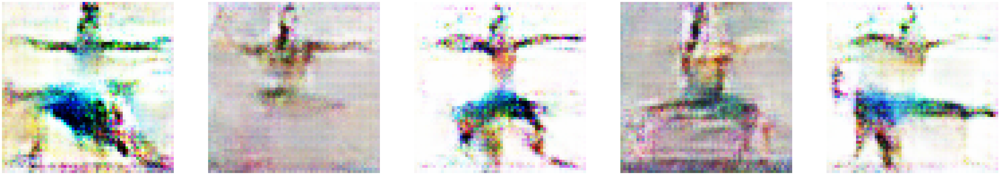

Epoch 91/100 
Duration: 174.30270 
D Loss: 0.27350 
G Loss: 2.87518


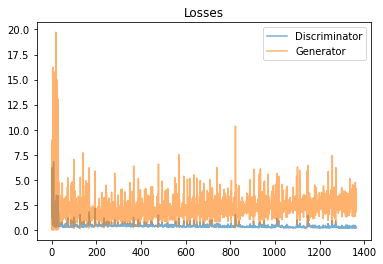

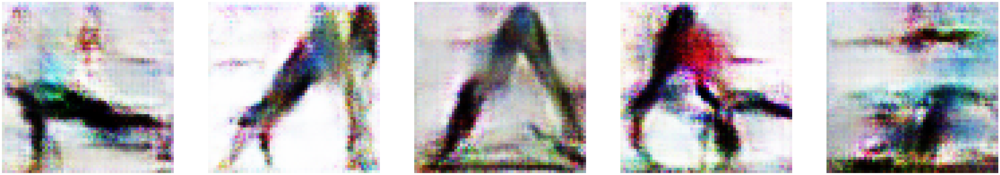

Epoch 92/100 
Duration: 174.04924 
D Loss: 0.28493 
G Loss: 2.96068


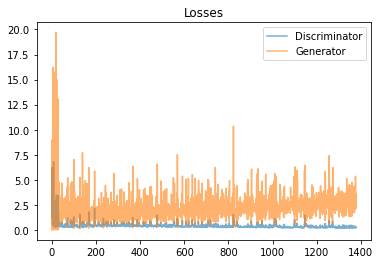

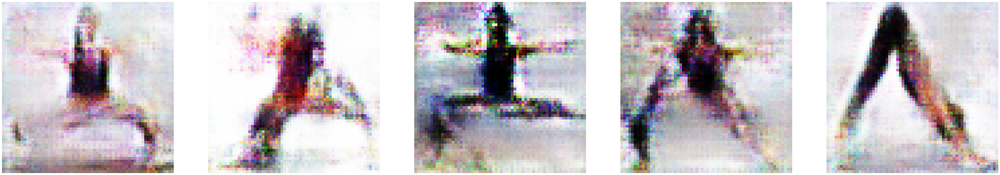

Epoch 93/100 
Duration: 174.09061 
D Loss: 0.30870 
G Loss: 3.04579


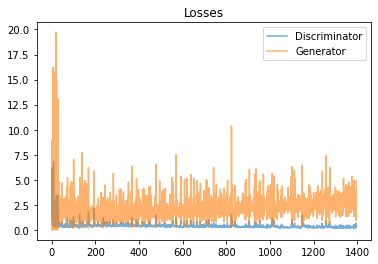

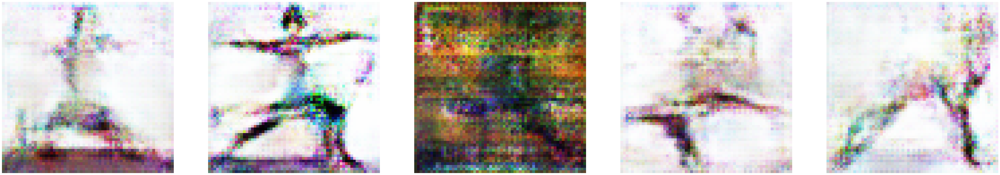

Epoch 94/100 
Duration: 173.98566 
D Loss: 0.28378 
G Loss: 2.67061


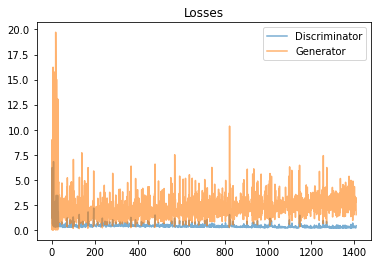

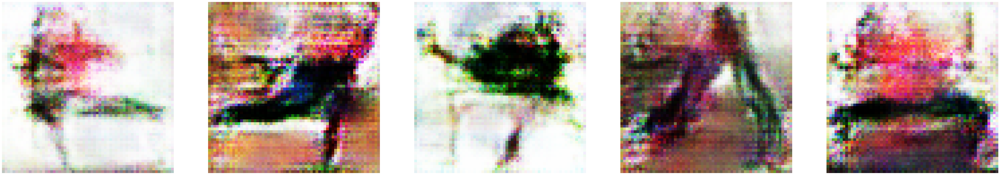

Epoch 95/100 
Duration: 175.48190 
D Loss: 0.24801 
G Loss: 2.88560


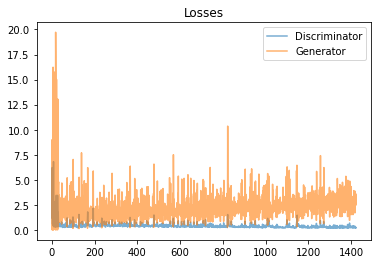

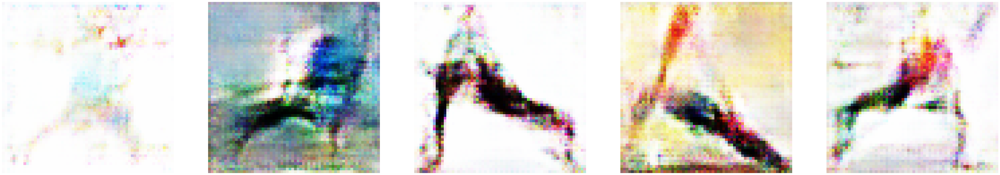

Epoch 96/100 
Duration: 173.89653 
D Loss: 0.22504 
G Loss: 2.92336


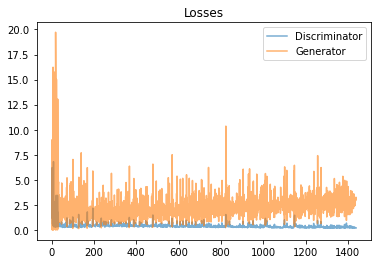

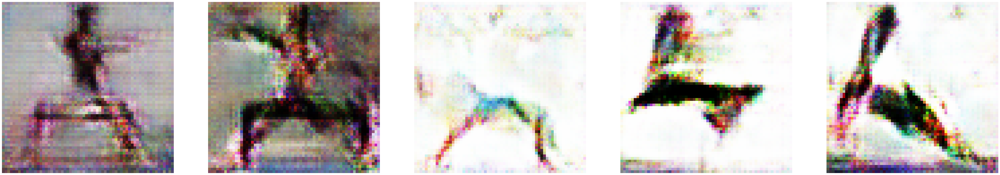

Epoch 97/100 
Duration: 176.15518 
D Loss: 0.27223 
G Loss: 2.98794


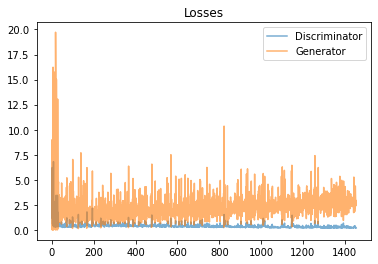

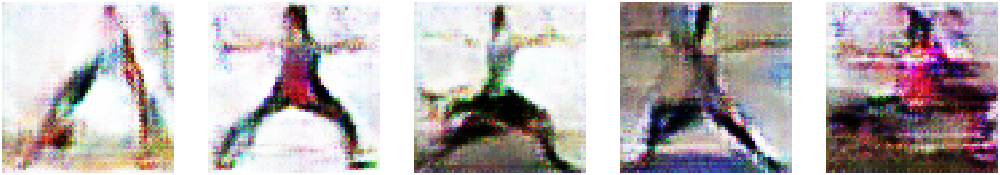

Epoch 98/100 
Duration: 181.10107 
D Loss: 0.35038 
G Loss: 3.15762


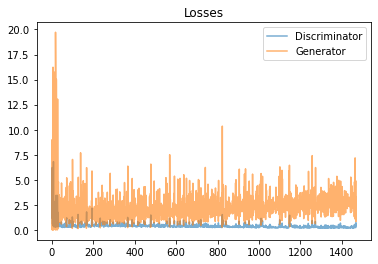

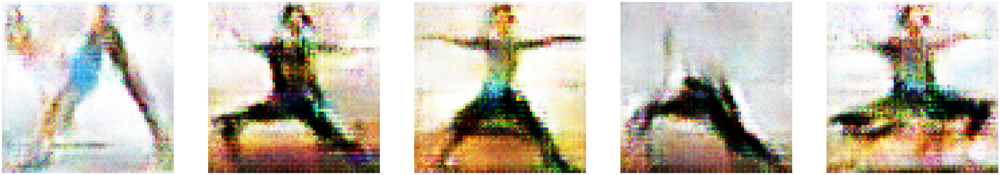

Epoch 99/100 
Duration: 174.65107 
D Loss: 0.32460 
G Loss: 2.73755


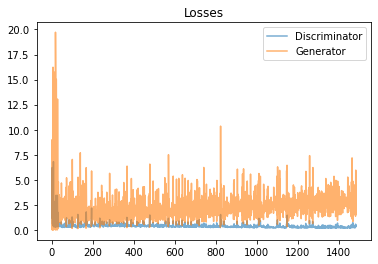

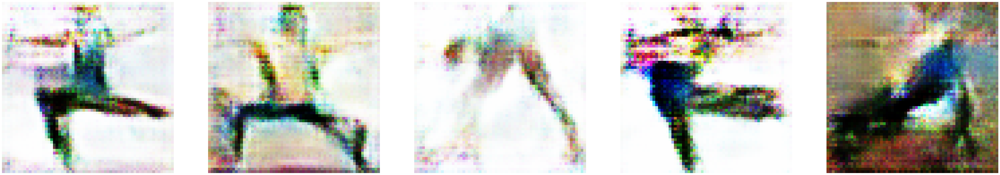

Epoch 100/100 
Duration: 174.54272 
D Loss: 0.26395 
G Loss: 2.89182


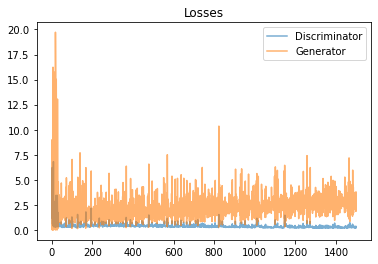

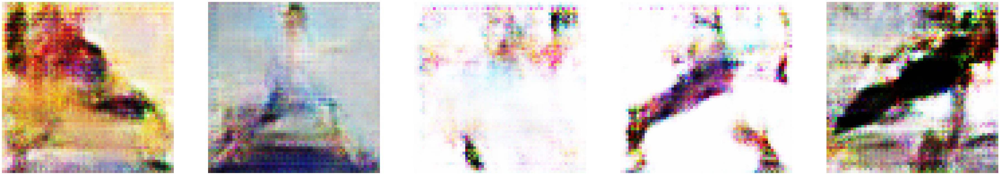

>> Generating 1k images ...


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  This is separate from the ipykernel package so we can avoid doing imports until


FileNotFoundError: ignored

In [ ]:
start = time.time()

print(">> Start training...")
with tf.Graph().as_default():
    train(get_batches(imagesIn), imagesIn.shape)
    
print(">> train time = ",time.time() - start)

# **Generated dogs**

In [ ]:
imgs = os.listdir('/kaggle/working/images')
print ("images = ",len(imgs))

plt.figure(figsize=(10,10))
for i,image in enumerate(imgs):
    im= Image.open('images/'+image)
    plt.subplot(3,3,i+1)
    plt.axis("off")
    plt.imshow(im)    
    if(i==8):
        break

In [ ]:
shutil.make_archive('images', 'zip', 'images')
!ls

In [ ]:
imgs = os.listdir('/kaggle/working/images')
print ("images = ",len(imgs))

# read image
img = cv2.imread('/kaggle/working/images/'+imgs[0], cv2.IMREAD_UNCHANGED)
 
# get dimensions of image
dimensions = img.shape
 
# height, width, number of channels in image
height = img.shape[0]
width = img.shape[1]
channels = img.shape[2]
 
print('Image Dimension    : ',dimensions)
print('Image Height       : ',height)
print('Image Width        : ',width)
print('Number of Channels : ',channels)